
<a class="anchor" id="top"></a>
<h1 align="center" style="margin-top:10px">Airbnb House Pricing</h1>

This notebook analyses Airbnb data in Sydney to predict the house prices. It begins with EDA and feature engineering, then constructs five different models and evaluates them with multiple metrics.


0. [Packages and Settings](#package)  
1. [Airbnb Data](#data)
2. [Exploratory Data Analysis & Feature Engineering](#explore)
3. [Data Preparation and Model Set-up](#prep)  
   3.0 [Feature Correlation & Selection](#corr)  
   3.1 [Model 1 (Linear With Regularisation)](#model1)  
   3.2 [Model 2 (Linear With Feature Selection)](#model2)  
   3.3 [Model 3 (Generative Additive Model - Non-linear)](#model3)  
   3.4 [Model 4 (Tree-Based](#model4)  
   3.5 [Model 5 (Gradient Boosting)](#model5)  
4. [Results](#results)  

# 0. Packages and Settings <a class="anchor" id="package"></a>

This notebook relies on the following imports and settings.

[Back to top](#top) 

In [1]:
# Import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
import graphviz

# Exploration packages
from dataprep.eda import plot
from dataprep.eda import plot_correlation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from collections import Counter
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords', quiet=True)
import missingno as msno
import warnings
warnings.filterwarnings("ignore")

NumExpr defaulting to 4 threads.


In [2]:
# Scikit-learn, encoders & modelling packages

# Training and optimising methods
from sklearn.model_selection import train_test_split

# Pre-processing
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.preprocessing import PowerTransformer #yj = PowerTransformer(method='yeo-johnson')
from category_encoders.target_encoder import TargetEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder
from category_encoders.james_stein import JamesSteinEncoder
from category_encoders.glmm import GLMMEncoder
from category_encoders.cat_boost import CatBoostEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_extraction.text import CountVectorizer 

# Models
from sklearn import linear_model
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import export_graphviz
from pygam import LinearGAM, s, f, l, te

# Metrics
from sklearn.metrics import mean_squared_error, r2_score,  mean_absolute_error, mean_squared_log_error
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, mutual_info_classif, f_classif, SelectPercentile, SelectFpr, SelectFdr, SelectFwe
import statsmodels.api as sm

In [3]:
# Plot settings
sns.set_context('notebook') # Optimise figures for notebook display
sns.set_style('ticks')      # Set default plot style
colours = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F', 
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']
sns.set_palette(colours)    # Set custom color scheme
%matplotlib inline
plt.rcParams['figure.figsize'] = (9, 6)

# 1. Airbnb Data <a class="anchor" id="data"></a>

Our training dataset is read from the csv "*train.csv*", our test dataset is read from the csv "*test.csv*".

[Back to top](#top) 

In [4]:
# Read in train data
data = pd.read_csv('train.csv')
main_df = data.copy()

print('Shape of DataFrame:', main_df.shape)

response = ['price']
main_df[response] = main_df[response].replace({'\$': '', ',': ''}, regex=True).astype(float)
main_df.head()

Shape of DataFrame: (20408, 60)


,name,description,neighborhood_overview,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,...,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price
0,Sunny huge private room in Paddington,NaN,NaN,Maritzza,2015-08-06,"Sydney, New South Wales, Australia",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,t,2,0,2,0,NaN,85.0
1,Gorgeous large 3 bedroom terrace house,Our house is perfect for families or small gro...,Whilst Camperdown and Newtown are really livel...,Liv,2010-12-08,"New South Wales, Australia",.,NaN,NaN,NaN,...,10.0,10.0,10.0,t,1,1,0,0,0.16,400.0
2,1 BR Apt with great small terrace in Surry Hills,"Lovely 2 storey apartment in Surry Hills, one ...",NaN,Emanuele,2016-09-17,"Turin, Piedmont, Italy",NaN,NaN,NaN,NaN,...,10.0,10.0,9.0,t,1,1,0,0,0.05,229.0
3,Modern Apartment Close to Everything,Fantastic brand new Apartment with Panoramic v...,Multicultural Parramatta combines a buzzing co...,Leah,2017-10-27,"Parramatta, New South Wales, Australia",NaN,NaN,NaN,NaN,...,10.0,10.0,10.0,t,1,0,1,0,0.05,220.0
4,Charming parkside apartment in quiet area,How many holiday rentals allow you to walk out...,"Twenty minutes to the west of the Sydney CBD, ...",MadeComfy,2019-07-24,"Sydney, New South Wales, Australia","Hi, and welcome to MadeComfy!\n\nWe are a team...",NaN,NaN,NaN,...,10.0,10.0,8.0,t,189,189,0,0,0.90,127.0


In [5]:
# test_size = 0.2  # 80% training, 20% validation
# random_state = 16  # Set a random state for reproducibility
# train_df, test_df = train_test_split(main_df, test_size=test_size, random_state=random_state)

# 2. Exploratory Data Analysis & Feature Engineering <a class="anchor" id="explore"></a>
Before selecting and optimising the models; including feature selection and transformation, EDA is needed for all features to better understand them and types of further analysis required:

* Explore the distribution of the response, `price`
* Assess the predictors, their data types, and possible transformations required (e.g. categoric, continuous)
* Measure relationships and correlation between features (high-level feature selection, eliminate redundant features)
* Analyse relationships with response variable and options for transformation (e.g. log, encoding, imputation)
* Undertake exploratory feature engineering (e.g. NLP, special transformation/encoding)
* Determine hypothesis for relevant features for hypothesis models

[Back to top](#top) 

### 2.1 Response Variable
As seen below that `price` is heavily right-skewed.

The Yeo-Johnson transformation is applied to convert this to a normal distribution, which will help with some of the exploratory analysis and modelling. 

*Note: Some models don't require normally distributed data, hence the transformed response only used where it improves the analysis/predictions.*

count    20408.000000
mean       227.934633
std        289.551232
min         51.000000
25%         90.000000
50%        140.000000
75%        249.000000
max       5000.000000
Name: price, dtype: float64


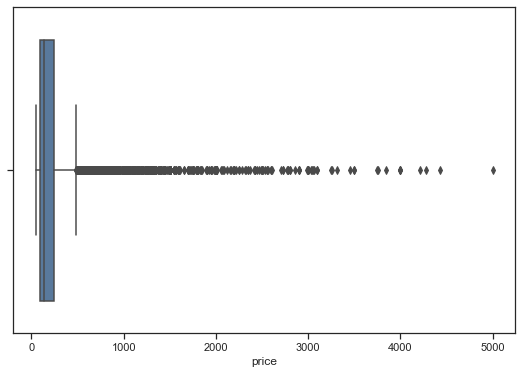

In [6]:
# Data is heavily right-skewed
print(main_df['price'].describe())

sns.boxplot(x = 'price', data = main_df)
plt.show()

  0%|          | 0/65 [00:00<?, ?it/s]


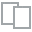
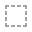
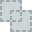
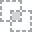
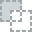
...
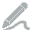
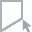
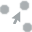
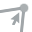
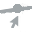

In [7]:
# An alternative quick way to plot
plot(main_df['price']) 

  0%|          | 0/65 [00:00<?, ?it/s]


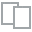
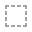
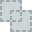
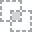
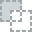
...
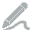
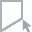
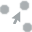
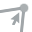
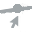

In [8]:
# Yeo-Johnson transformation of response variable

yj = PowerTransformer(method='yeo-johnson')
main_df['price_yeotransform'] = yj.fit_transform(main_df[['price']])

plot(main_df['price_yeotransform'])

As the pricing data is heavily skewed, transforming it resulted in a much better visualisation

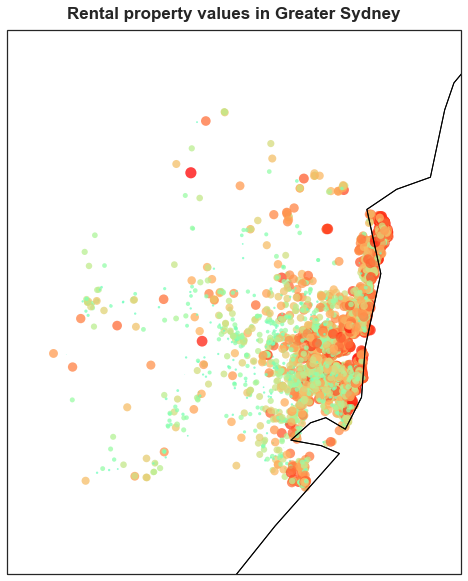

In [9]:
# Using cartopy to visualise a map

# Greater Sydney latitude and longitude for the edges of the map (top left - bottom right)
lat1, lat2, lon1, lon2 = -33.25, -34.25, 150.5, 151.5

# Get latitude and longitude for each data point
train_lon, train_lat = (main_df['longitude'].to_numpy(), main_df['latitude'].to_numpy())
train_scale = main_df['price_yeotransform'].to_numpy()

# Create figures
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection = ccrs.Mercator())

# Scatter plot as heat map
ax.scatter(train_lon, train_lat, s=(train_scale*50), c=train_scale, 
           edgecolors='none', cmap=plt.get_cmap('rainbow'), alpha=0.75, transform=ccrs.PlateCarree())

# Add state borders and coast line
ax.add_feature(cfeature.STATES.with_scale('50m'))
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.set_extent([lon1, lon2, lat1, lat2], crs=ccrs.PlateCarree())

# Add title
ax.set_title('Rental property values in Greater Sydney', fontsize=17, y=1.01, fontweight='bold')
plt.show()

### 2.2 Feature Data Types & Preparation
This starts with:
1. identifying the data types, missing values, and potential pre-processing required for the data to be machine readable (e.g. booleans, dates and percentages).
2. identify features that may require further feature engineering or transformations (i.e. feature extraction, missing values & encoding).

The table below provides a summary of this analysis and potential activity to take, subject to further exploration. 
Same transformation applied to the training and test data (excl. response).

In [10]:
# Table to initialise the columns, data types and conversion/treatment required
# Adding an additional column for missing values at the bottom of the cell

initial_columns = [
    ['name', 'string', 'possible NLP'],
    ['description', 'string', 'possible NLP'],
    ['neighborhood_overview', 'string', 'redundant - neighborhood'],
    ['host_name', 'string', 'redundant - listing no.'],
    ['host_since', 'date', 'convert to continuous'],
    ['host_location', 'high_cardinality', 'Irrelevant - Unrelated to property'],
    ['host_about', 'string', 'Irrelevant - Unrelated to property'],
    ['host_response_time', 'categoric', 'standard encoding'],
    ['host_response_rate', 'percentage', 'convert to continuous'],
    ['host_acceptance_rate', 'percentage', 'convert to continuous'],
    ['host_is_superhost', 'binary', 'very low relationship w/ price'],
    ['host_neighbourhood', 'high_cardinality', 'special encoding'],
    ['host_listings_count', 'continuous', 'moderate correlation w/ price'],
    ['host_total_listings_count', 'continuous', 'redundant - colinear w/ host_listings_count'],
    ['host_verifications', 'custom', 'special encoding'],
    ['host_identity_verified', 'binary', 'very low relationship w/ price'],
    ['neighbourhood', 'string', 'noise and messy, lots of nans'],
    ['neighbourhood_cleansed', 'high_cardinality', 'target encoding,high corr'],
    ['neighbourhood_group_cleansed', 'custom', 'all 0, dropping'],
    ['latitude', 'continuous', 'redundant - replace by neighborhood'],
    ['longitude', 'continuous', 'redundant - replace by neighborhood'],
    ['property_type', 'high_cardinality', 'target encoding,high corr'],                         
    ['room_type', 'categoric', 'description'],
    ['accommodates', 'continuous', 'highly correlated w/ price'],
    ['bathrooms_text', 'string', 'NLP to convert to continuous'],
    ['bedrooms', 'continuous', 'description'],
    ['beds', 'continuous', 'description'],
    ['amenities', 'custom', 'description'],
    ['minimum_nights', 'continuous', 'description'],
    ['maximum_nights', 'continuous', 'description'],
    ['minimum_minimum_nights', 'continuous', 'redundant - high corr w/ maximum_nights'],
    ['maximum_minimum_nights', 'continuous', 'description'],
    ['minimum_maximum_nights', 'continuous', 'description'],
    ['maximum_maximum_nights', 'continuous', 'description'],
    ['minimum_nights_avg_ntm', 'continuous', 'description'],
    ['maximum_nights_avg_ntm', 'continuous', 'description'],
    ['has_availability', 'binary', 'description'],
    ['availability_30', 'continuous', 'description'],
    ['availability_60', 'continuous', 'description'],
    ['availability_90', 'continous', 'description'],
    ['availability_365', 'continuous', 'description'],
    ['number_of_reviews', 'continuous', 'description'],
    ['number_of_reviews_ltm', 'continuous', 'description'],
    ['number_of_reviews_l30d', 'discrete', 'description'],
    ['first_review', 'date', 'convert to continous'],
    ['last_review', 'date', 'convert to continous'],
    ['review_scores_rating', 'continuous', 'Relevant'],
    ['review_scores_accuracy', 'continuous', 'Sub-rating score'],
    ['review_scores_cleanliness', 'continuous', 'Sub-rating score'],
    ['review_scores_checkin', 'continuous', 'Sub-rating score'],
    ['review_scores_communication', 'continuous', 'Sub-rating score'],
    ['review_scores_location', 'continuous', 'Sub-rating score'],
    ['review_scores_value', 'continuous', 'Sub-rating score'],
    ['instant_bookable', 'binary', 'description'],
    ['calculated_host_listings_count', 'continuous', 'redundant - high correlation with host_listings_count'],
    ['calculated_host_listings_count_entire_homes', 'continuous', 'redundant - high correlation with host_listings_count'],
    ['calculated_host_listings_count_private_rooms', 'continuous', 'redundant - high correlation with host_listings_count'],
    ['calculated_host_listings_count_shared_rooms', 'continuous', 'redundant - high correlation with host_listings_count'],
    ['reviews_per_month', 'continuous', 'Freq of reviews - missing if none'],
    ['price', 'response', 'Response variable']
    ]

columns_types = pd.DataFrame(initial_columns, columns = ['Feature', 'Type', 'Relevance'])

# Add in the missing values
columns_types['MissingVals'] = 0
for i, col in enumerate(columns_types.loc[:,'Feature'].values):
    columns_types.loc[i, 'MissingVals'] = main_df[col].isnull().sum()

display(columns_types)

,Feature,Type,Relevance,MissingVals
0,name,string,possible NLP,0
1,description,string,possible NLP,657
2,neighborhood_overview,string,redundant - neighborhood,7872
3,host_name,string,redundant - listing no.,0
4,host_since,date,convert to continuous,0
5,host_location,high_cardinality,Irrelevant - Unrelated to property,24
6,host_about,string,Irrelevant - Unrelated to property,9544
7,host_response_time,categoric,standard encoding,12023
8,host_response_rate,percentage,convert to continuous,12023
9,host_acceptance_rate,percentage,convert to continuous,10718


Next, converting features into machine readable datatypes based on the data type
**Notes:** 
1. *This cell block only works once per kernel as it's changing the data types in place! (easier to track than handling many copies)*
2. *This is only transforming the original predictors, hence ignoring response and new features.*

In [11]:
def convert_basic_types(data):
    '''
    Convert the base columns of the test/train dataset into machine readable values

    Arguments:
    data - a pd.DataFrame (object)
    '''

    data['last_day'] = '2021-10-01'
    data['last_day'] = pd.to_datetime(data['last_day'])

    for col in columns_types['Feature']:
        
        if int(columns_types[columns_types["Feature"] == col]["Type"]=='binary') == 1:
            # Convert binary from 't-f' to '1-0'
            data[col].replace(['t', 'f'], [1, 0], inplace=True)

        elif int(columns_types[columns_types["Feature"] == col]["Type"]=='percentage') == 1:
            # Percentage to float:
            data[col] = data[col].str.rstrip('%').astype(float) / 100.0

        elif int(columns_types[columns_types["Feature"] == col]["Type"]=='date') == 1:
            # Date to no. days before 01-10-2021
            data[col] = pd.to_datetime(data[col])
            data[col] = (data['last_day'] - data[col]).dt.days
            
    data = data.drop(columns='last_day', inplace=True)

    return None
        
convert_basic_types(main_df)

main_df.head()

,name,description,neighborhood_overview,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,...,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price,price_yeotransform
0,Sunny huge private room in Paddington,NaN,NaN,Maritzza,2248,"Sydney, New South Wales, Australia",NaN,NaN,NaN,NaN,...,NaN,NaN,1,2,0,2,0,NaN,85.0,-0.863793
1,Gorgeous large 3 bedroom terrace house,Our house is perfect for families or small gro...,Whilst Camperdown and Newtown are really livel...,Liv,3950,"New South Wales, Australia",.,NaN,NaN,NaN,...,10.0,10.0,1,1,1,0,0,0.16,400.0,1.255222
2,1 BR Apt with great small terrace in Surry Hills,"Lovely 2 storey apartment in Surry Hills, one ...",NaN,Emanuele,1840,"Turin, Piedmont, Italy",NaN,NaN,NaN,NaN,...,10.0,9.0,1,1,1,0,0,0.05,229.0,0.674305
3,Modern Apartment Close to Everything,Fantastic brand new Apartment with Panoramic v...,Multicultural Parramatta combines a buzzing co...,Leah,1435,"Parramatta, New South Wales, Australia",NaN,NaN,NaN,NaN,...,10.0,10.0,1,1,0,1,0,0.05,220.0,0.625853
4,Charming parkside apartment in quiet area,How many holiday rentals allow you to walk out...,"Twenty minutes to the west of the Sydney CBD, ...",MadeComfy,800,"Sydney, New South Wales, Australia","Hi, and welcome to MadeComfy!\n\nWe are a team...",NaN,NaN,NaN,...,10.0,8.0,1,189,189,0,0,0.90,127.0,-0.147333


Below is to analyse the relationship between each feature and continuous predictors.

For now, let's ignore any missing values and text-based features - these will be explored in the next section.

In [12]:
# This function is for plotting regressions only
def plotregressions(X, y, lowess=False):
    # X should be a pandas dataframe
    
    colours = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F', 
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']

    # Feature names
    labels = list(X.columns)
    
    n, p = X.shape
    
    # 3 plots per column, calculate the required number of rows accordingly
    rows = int(np.ceil(p/3)) 
    
    # Create a plot grid
    fig, axes = plt.subplots(rows, 3, figsize=(12, rows*(12/4)))

    # Loop over the plot grid, create 
    for i, ax in enumerate(fig.axes):
        if i < p:
            
            # Scatter plot with local smoothing
            sns.regplot(X.iloc[:, i], y,  ci=None, y_jitter=0.05, 
                        scatter_kws={'s': 25, 'alpha':.8}, ax=ax, lowess=lowess, color=colours[i % 10])
            
            # Remove axis labels to de-clutter the plot
            ax.set_xlabel('')
            ax.set_ylabel('')
            
            # Manually set the limits for the horizontal axis since the default doesn't work so well
            xmin = X.iloc[:,i].min()
            xmax = X.iloc[:,i].max()
            ax.set_xlim(xmin - (xmax-xmin)*0.05, xmax + (xmax - xmin)*0.05)
            
            # Use the feature name for the title
            ax.set_title(labels[i])
        else:
            # Delete unnecessary subplot (last row)
            fig.delaxes(ax)

    sns.despine()
    plt.tight_layout()
    
    return fig, axes

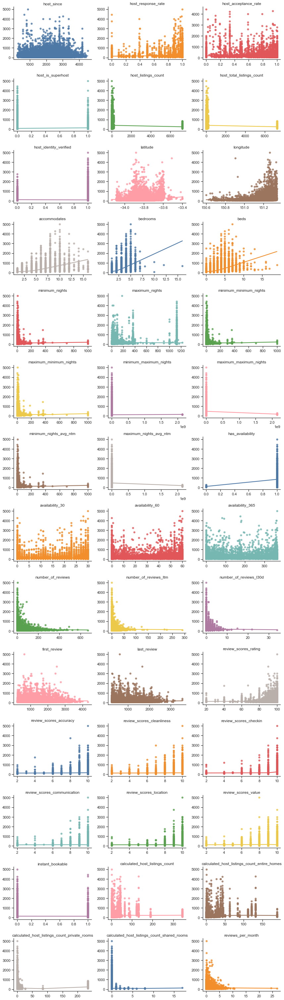

In [13]:
# Capture only numeric predictors for regression plot
numeric_predictors = []

for col in columns_types['Feature']:
    col_type = columns_types[columns_types["Feature"] == col]["Type"].values
    if col_type in ['continuous', 'discrete', 'binary', 'percentage', 'date']:
        numeric_predictors.append(col)
        
numeric_predictors

plotregressions(main_df[numeric_predictors], main_df['price'], lowess=True)
plt.show()

As seen above it's hard to visualise what's happening due to the few very high priced listings (>$1000).

Applying the yj transformation helps to even the distribution and illustrates there is a less obvious relationship

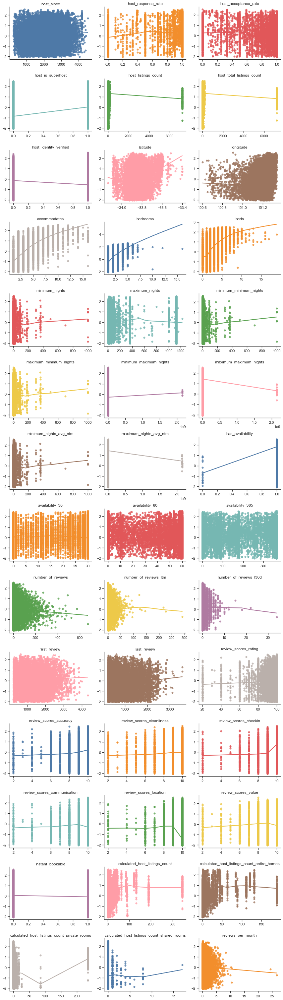

In [14]:
plotregressions(main_df[numeric_predictors], main_df['price_yeotransform'], lowess=True)

plt.show()

While univariate relationships between the predictors and response look limited, as observed already there are some features that are not normally distributed, have outlier values and/or could otherwise require transformation for linear modelling to reduce the risk of becoming a leverage point: `host_listings_count`, `reviews_per_month`, `number_of_reviews`.

Now that we have some idea of how the predictors relate to the response, let's observe which features are highly correlated.

I'll remove features that seem to be redundant, or note that these are highly correlated and may have some interaction as well.

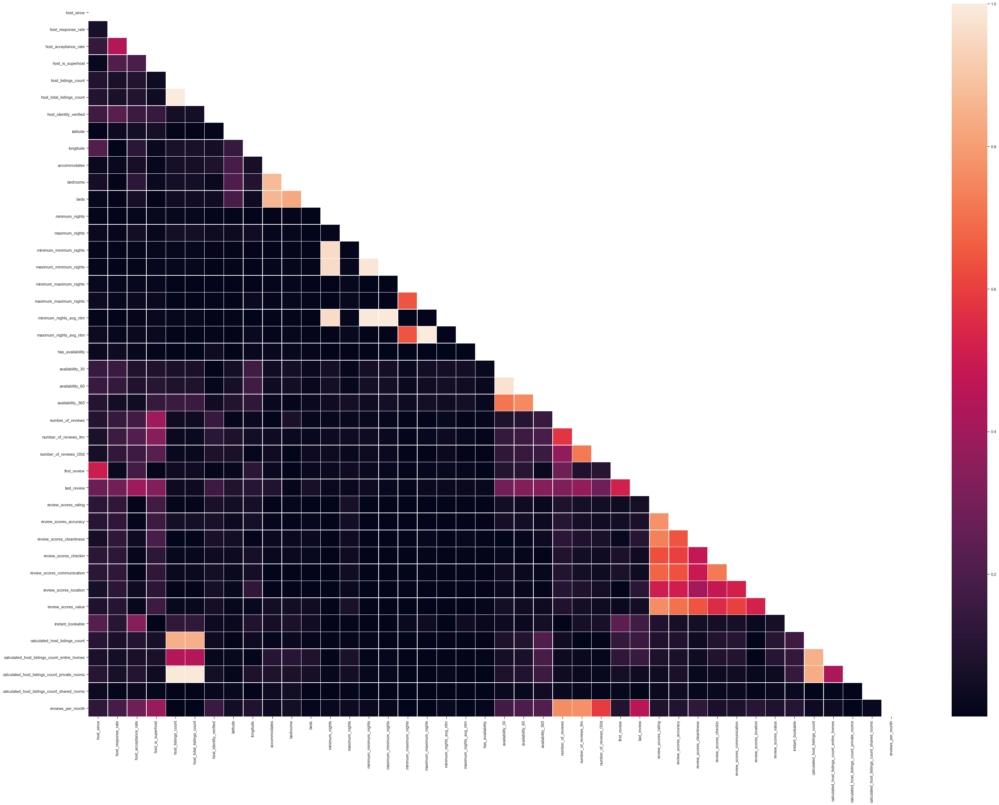

In [15]:
# Using a heatmap to observe correlation between all features (through correlation matrix)
corr = abs(main_df[numeric_predictors].corr())
mask = np.triu(np.ones_like(corr, dtype=bool))
f,ax = plt.subplots(figsize=(50, 36))
sns.heatmap(corr,mask=mask, linewidths=.5,ax=ax)
plt.show()

As observed, the following highly correlated predictors:
* `Host_listings_count` and `host_listings_count_calculations`
* Review ratings scores
* Minimum and maximum nights average
* `Reviews_per_month` and `num_of_reviews`
* `Accommodates`, `bedrooms`, and `beds`
* `Availability30_60_365`

Feature selection methods will be explored during modelling to reduce some of these features

### 2.3 Missing Values & Simple Encoding
For most models, they can't handle with any missing values and categoric variables. Hence for simplicity I applied these actions for use in all models.

*Note: For tree-based methods (e.g. Random Forest and Gradient Boosting), some models can deal with missing and categoric variables without transforming them first. There may be potential future improvements by focussing on which features perform better with/without adjustments.

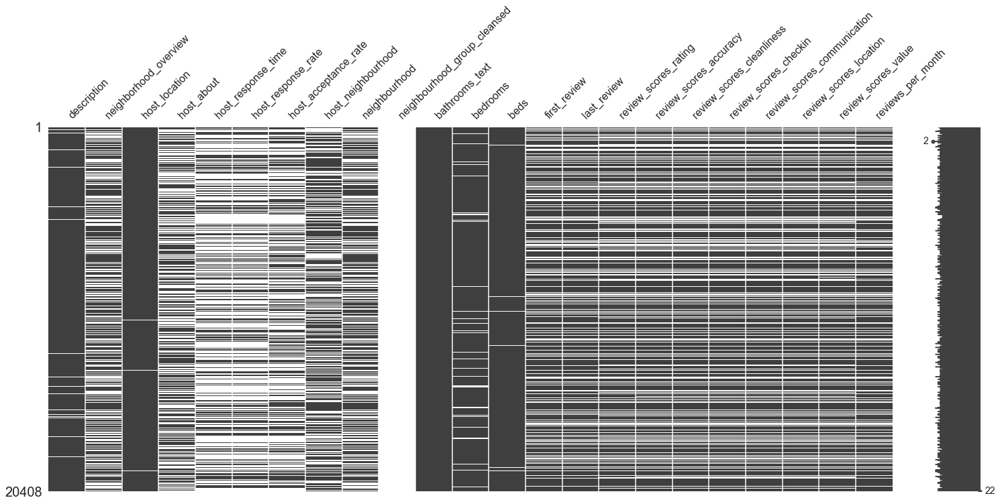

neighbourhood_group_cleansed    20408
host_response_time              12023
host_response_rate              12023
host_acceptance_rate            10718
host_about                       9544
neighborhood_overview            7872
neighbourhood                    7870
host_neighbourhood               7652
review_scores_value              6609
review_scores_location           6605
review_scores_checkin            6604
review_scores_accuracy           6600
review_scores_communication      6594
review_scores_cleanliness        6592
review_scores_rating             6564
last_review                      5884
first_review                     5884
reviews_per_month                5884
bedrooms                         1372
description                       657
beds                              194
host_location                      24
bathrooms_text                     15
dtype: int64

In [16]:
# Using missingno to visualize the missing values for data types
missing_cols = columns_types['Feature'][columns_types.loc[:, 'MissingVals'] > 0]
msno.matrix(main_df[missing_cols])
plt.show()

main_df[missing_cols].isnull().sum().sort_values(ascending=False)

In [17]:
# a) Dropping 'neighbourhood_group_cleansed' as there are no values
# b) host response & acceptance rates are numeric - let's take the mean for imputation
# c) neighborhood are text-based - for missing values I'll just impute with 'unknown'
# d) review_scores are all reliant on the 'rating' - imputing with mean and flag where there are missing reviews
# e) first-last-reviews per month are also all related - would be more interested in the last review
# f) bedrooms & beds - will impute with median

def impute_column(data, column, value = None, flag_missing = False):
    '''
    Fill in missing values for a column

    Arguments:
    data   - a pd.DataFrame (object)
    column - the column name (string)
    value  - the value to impute, by default it takes the mean (float)
    flag_missing - If True, create a new column to identify when values were missing
    '''
    
    # Identify which values are missing
    if flag_missing:
        new_col = str(column)+'_missing'
        data[new_col] = 0
        data[new_col][data[column].isna()] = 1

    # Identify the value to impute
    if value is None or value == 'mean':
        impute_value = float(data[[column]].mean())
    elif value == 'median':
        impute_value = float(data[[column]].median())
    elif isinstance(value, int) or isinstance(value, float) or isinstance(value, str):
        impute_value = value
    else:
        return 'Value Error! Please input "mean", "median", or value to impute'
    
    # Insert imputed value where the data is missing
    data.loc[:,column] = data[column].fillna(value=impute_value)

    return data


def missingno_imputation(data):
    '''
    Impute missing values for a dataset

    Arguments:
    data - a pd.DataFrame (object)
    '''
    
    # Any text based features should be replace with empty strings
    for col in columns_types['Feature'][columns_types['Type']=='string']:
        impute_column(data, col, "")
    
    # Remove 'neighbourhood_group_cleansed' as there are no values
    data = data.drop(columns='neighbourhood_group_cleansed')
    
    # Remove irrelevant features such as 'first_review'
    data = data.drop(columns = 'first_review')

    # Deal with host_response_time' missingno with hot encoding and drop original column
    data = data.join(pd.get_dummies(data['host_response_time']))
    data = data.drop(columns = 'host_response_time')

    numeric_col_to_impute = [
        ('host_response_rate', 'mean', True),       
        ('host_acceptance_rate', 'mean'),           
        ('neighbourhood', 'Unknown'),               
        ('host_neighbourhood', 'Unknown'),          
        ('bedrooms', 'median', True),               
        ('beds', 'median', True),
        ('bathrooms_text', 1),                      
        ('last_review', 'median', True),
        ('reviews_per_month', 0),
        ('review_scores_value', 'mean', True),
        ('review_scores_location', 'mean'),
        ('review_scores_checkin', 'mean'),
        ('review_scores_accuracy', 'mean'),
        ('review_scores_communication', 'mean'),
        ('review_scores_cleanliness', 'mean'),
        ('review_scores_rating', 'mean')
        ]

    for columns in numeric_col_to_impute:
        impute_column(data, *columns)   # NOTE:*columns" means take each element of "columns" and insert it as arguments to the function
                                        
    return data

In [18]:
main_df = missingno_imputation(main_df)

### 2.4 More complex feature engineering
This section will be for more complicated processes such as:
* Natural Language Processing
* Special feature extraction
* More complex encoding

For dealing with **text based features**, Natural Language Processing (NLP) can help to extract key terms from descriptive columns.

In [19]:
# NLP - Identifying the frequency of word counts for string columns

# Frequency of most used words
text_col = columns_types['Feature'][columns_types['Type']=='string']

text_df = main_df[text_col]
text_data = text_df.values.tolist()
text_list = [" ".join(text) for text in text_data]

vect = CountVectorizer()
vect.fit(text_list)

text_token = [text.split() for text in text_list]
text_token_flat = [token.lower() for text in text_token for token in text]

# Identify the top 100 most frequent work tokens
x = sorted(Counter(text_token_flat).items(), reverse=True, key=lambda kv: kv[1])
x = x[:100]

token_freq = {key: value for (key, value) in x if not key in stopwords.words()}
print(token_freq)

{'/><br': 53408, 'apartment': 22577, '<br': 22331, '1': 19077, 'walk': 18971, 'sydney': 16404, 'beach': 16154, 'bath': 15149, 'bedroom': 14042, '2': 14018, 'space</b><br': 13920, 'australia': 13668, 'south': 13627, '/><b>the': 13608, '&': 13131, 'bondi': 12866, 'wales,': 12646, '/>-': 11640, 'room': 11505, 'home': 11084, '-': 10673, 'close': 9962, 'living': 9770, 'house': 9421, 'minutes': 9357, 'private': 9356, '/>the': 9150, 'located': 8875, 'city': 8843, 'great': 8747, 'love': 8490, 'large': 8483, 'beautiful': 8312, 'enjoy': 7981, 'kitchen': 7562, 'access': 7244, 'bed': 7173, '/><b>guest': 6709, 'place': 6674, 'area': 6669, 'access</b><br': 6625, 'modern': 6605, 'restaurants': 6480, 'baths': 6440, 'minute': 6413, 'away': 6094, 'perfect': 5976, '5': 5929, 'bus': 5897, 'quiet': 5680, '3': 5449, 'street': 5403, 'walking': 5401, 'family': 5342, 'short': 5320, 'bathroom': 5318}


Now let's create new features that capture the most frequently occurring words which may show some underlying patterns when they appear.

In [20]:
# Flag whether the frequent word exist in text descriptions
import time
start = time.time_ns()

def flag_freq_word(row, word_list, text_col):
    ''' Flag whether a frequent word exist in text data

    Arguments:
    row - a row of a pd.DataFrame object
    word - frequent word to test
    text_col - list of column names containing text data
    '''
    
    text_df = row[text_col]
    text_data = text_df.values.tolist()

    text_token = [text.split() for text in text_data]
    text_token_flat = [token.lower() for text in text_token for token in text]

    for word in word_list:
        if word in text_token_flat:
            row[word + '_Flag'] = 1
        else:
            row[word + '_Flag'] = 0
            
    return row
    
# Manually create the frequency word list based on observable non-feature words from the top-100 list
frequent_word_list = ['apartment', 'new', 'walk', 'beach', 'bondi', 'space', 'room', 'home', 'close', 'living', 'house',
                     'minutes', 'private', 'great', 'love', 'large', 'beautiful', 'enjoy', 'access', 'modern',
                     'restaurants', 'minute', 'perfect', 'quiet', 'walking', 'short']

for word in frequent_word_list:
    main_df[word + '_Flag'] = 0
    
main_df = main_df.apply(lambda row: flag_freq_word(row, frequent_word_list, text_col), axis=1)

end = time.time_ns()
print('time: {}s'.format(float(end-start)/(10**9)))

main_df.head()

time: 17.428246s


,name,description,neighborhood_overview,host_name,host_since,host_location,host_about,host_response_rate,host_acceptance_rate,host_is_superhost,...,beautiful_Flag,enjoy_Flag,access_Flag,modern_Flag,restaurants_Flag,minute_Flag,perfect_Flag,quiet_Flag,walking_Flag,short_Flag
0,Sunny huge private room in Paddington,,,Maritzza,2248,"Sydney, New South Wales, Australia",,0.883331,0.780699,0,...,0,0,0,0,0,0,0,0,0,0
1,Gorgeous large 3 bedroom terrace house,Our house is perfect for families or small gro...,Whilst Camperdown and Newtown are really livel...,Liv,3950,"New South Wales, Australia",.,0.883331,0.780699,0,...,1,1,1,0,0,0,1,1,0,0
2,1 BR Apt with great small terrace in Surry Hills,"Lovely 2 storey apartment in Surry Hills, one ...",,Emanuele,1840,"Turin, Piedmont, Italy",,0.883331,0.780699,0,...,0,1,1,0,1,1,1,0,0,0
3,Modern Apartment Close to Everything,Fantastic brand new Apartment with Panoramic v...,Multicultural Parramatta combines a buzzing co...,Leah,1435,"Parramatta, New South Wales, Australia",,0.883331,0.780699,0,...,0,0,0,1,0,1,0,0,0,0
4,Charming parkside apartment in quiet area,How many holiday rentals allow you to walk out...,"Twenty minutes to the west of the Sydney CBD, ...",MadeComfy,800,"Sydney, New South Wales, Australia","Hi, and welcome to MadeComfy!\n\nWe are a team...",0.883331,0.780699,0,...,1,1,0,1,1,1,0,1,1,0


For the host location, the first word is used and replaced any missing values with 'Unknown'. Australian is the majority of host locations.

In [21]:
# Convert host location to country

host_loc_list = main_df['host_location'].unique().tolist()

new_dict = {}
for location in host_loc_list:
    if type(location) == str:
        new_dict[location] = location.split(',')[-1].lstrip(' ').lower()

new_dict[np.nan] = 'Unknown'

main_df['host_location'].replace(new_dict, inplace=True)

main_df['host_location'].value_counts()

# Host location is majority Australian (>75%), then starting to see very low representation

australia             16350
au                     2520
united kingdom          432
united states           123
china                   110
                      ...  
croatia                   1
sri lanka                 1
gt                        1
th                        1
northern territory        1
Name: host_location, Length: 134, dtype: int64

  0%|          | 0/74 [00:00<?, ?it/s]


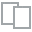
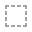
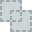
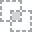
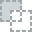
...
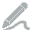
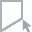
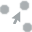
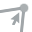
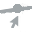

In [22]:
# We use a word cloud to see which words occur the most
plot(main_df, "amenities")

In [23]:
# Engineer the amenities by counting the total no. via the listed quotations
main_df['amenities'] = main_df['amenities'].str.count('"')/2
main_df['amenities']

0         9.0
1        34.0
2        17.0
3        14.0
4        29.0
         ... 
20403     9.0
20404    29.0
20405    12.0
20406    10.0
20407    25.0
Name: amenities, Length: 20408, dtype: float64

In [24]:
# Convert the text based bathrooms columns to numeric

# Extracting the numbers only in 'bathrooms_text' 
main_df['bathrooms_text'] = main_df['bathrooms_text'].str.extract(r'(\d*\.\d+|\d+)').astype(float, errors = 'raise')

# Round up the number of bathrooms
main_df['bathrooms_text'] = main_df['bathrooms_text'].round().fillna(1)
main_df['bathrooms_text'].value_counts().sort_index()

0.0        66
1.0     14076
2.0      5140
3.0       710
4.0       349
5.0        27
6.0        29
7.0         1
8.0         1
10.0        1
18.0        8
Name: bathrooms_text, dtype: int64

In [25]:
# Verification Columns

def verification_dummy(data, col_name, verification):
    data.loc[data[col_name].str.contains(verification), 'v_'+verification] = 1
    data.loc[~data[col_name].str.contains(verification), 'v_'+verification] = 0
    
    return data

def verification_encoding(data):
    '''
    Encode the 'host_verifications' and sum the total

    Arguments:
    data   - a pd.DataFrame (object)
    '''
    if 'host_verifications' in data.columns:
        # Manually extracted from host_verifications column
        verification_list = ['facebook', 'phone', 'reviews', 'jumio', 'offline_government_id',
                         'selfie', 'government_id', 'identity_manual', 'work_email', 'google']

        for verification in verification_list:
            verification_dummy(data, 'host_verifications', verification)

        column_list = ['v_'+ver for ver in verification_list]
        data['sum_verification'] = data[column_list].sum(axis=1)

        # Drop the column after transformation complete
        data.drop(columns = 'host_verifications', inplace = True)
        print('Column transformed and original dropped')
    else:
        print('Column already transformed')
    
    return data

main_df = verification_encoding(main_df)

Column transformed and original dropped


### 2.5 Feature Encoding and Other Complex Engineering
This section is to complete the initial exploration and feature engineering with some more specialised encoding practices. These encodings may / may not be used by all models, however they are general enough to be applied here as potential features for each model.

* Special encoding
* Censoring

In [26]:
# The following low cardinality categoric variables can be one-hot encoded
for col in columns_types['Feature']:
        if int(columns_types[columns_types["Feature"] == col]["Type"]=='categoric') == 1:
            print(col)

# For the remaining categoric features, the first category to avoid multi-colinearity
main_df = pd.get_dummies(main_df, prefix = ['room_type'], columns = ['room_type'], drop_first = True)


host_response_time
room_type


The following features have high cardinality, and potentially require an alternative encoding to one-hot encoding:

* `neighbourhood_cleansed`: 38 categoric variables
* `property_type`: 73 categoric variables
* `host_neighbourhood`: 217 categoric variables

In [27]:
# The following high cardinality categoric variables can utilize a target encoding
# Note: Alternative types were trialled with minimal change in results

for col in columns_types['Feature']:
        if int(columns_types[columns_types["Feature"] == col]["Type"]=='high_cardinality') == 1:
            print(col)

# Target encoding for neighbourhood_cleansed and property_type
print('There are {} categories in neighbourhood_cleansed'.format(main_df['neighbourhood_cleansed'].value_counts().count()))
encoder1 = TargetEncoder()
encoder1.fit(main_df['neighbourhood_cleansed'], main_df['price'])
main_df['neightbourhood_encoded'] = encoder1.transform(main_df['neighbourhood_cleansed'])

print('There are {} categories in property_type'.format(main_df['property_type'].value_counts().count()))
encoder2 = TargetEncoder()
encoder2.fit(main_df['property_type'], main_df['price'])
main_df['property_type_encoded'] = encoder2.transform(main_df['property_type'])

print('There are {} categories in host_neighbourhood'.format(main_df['host_neighbourhood'].value_counts().count()))
encoder3 = TargetEncoder()
encoder3.fit(main_df['host_neighbourhood'], main_df['price'])
main_df['host_neighbourhood_encoded'] = encoder3.transform(main_df['host_neighbourhood'])

host_location
host_neighbourhood
neighbourhood_cleansed
property_type
There are 38 categories in neighbourhood_cleansed
There are 73 categories in property_type
There are 217 categories in host_neighbourhood


[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 39.0, 40.0, 41.0, 42.0, 43.0, 47.0, 48.0, 50.0, 51.0, 55.0, 59.0, 60.0, 63.0, 64.0, 67.0, 72.0, 85.0, 86.0, 89.0, 111.0, 115.0, 124.0, 138.0, 164.0, 189.0, 7235.0]
Original max: 7235.0
Revised max: 100.0


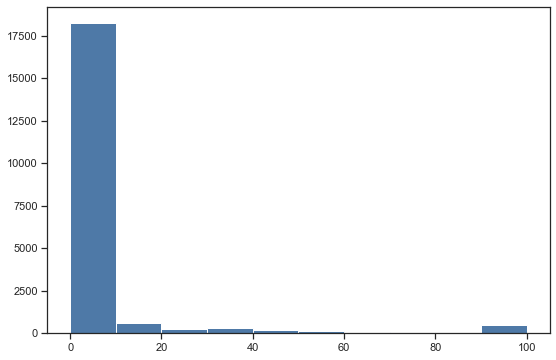

In [28]:
# For 'host_listings_count', there is an outlier for a large UK company
# Flag this and censor the value

host_listings_count = list(set(main_df['host_listings_count'].values))
host_listings_count.sort()
print(host_listings_count)
print("Original max:", max(main_df['host_listings_count']))

def limit_host_listings(data, limit):
    ''' Limit no. of host listings above a threshold and flag any from Tream Gospodin

    Arguments:
    data   - a pd.DataFrame (object)
    limit  - integer limit of count (int)
    '''
    
    real_estate_group_dummy = data[data['host_listings_count'] == 'NaN']
    data.loc[data['host_name'] == "Team Gospodin", 'real_estate_group_dummy'] = 1
    data.loc[data['host_name'] != "Team Gospodin", 'real_estate_group_dummy'] = 0
    
    data.loc[data['host_listings_count']>limit, 'host_listings_count'] = limit
    
    return data['host_listings_count']

main_df['host_listings_count_censored'] = limit_host_listings(main_df, 100)

print("Revised max:", max(main_df['host_listings_count_censored']))

plt.hist(main_df['host_listings_count_censored'])
plt.show()

### 2.6 Automated EDA on process features and ensuring machine readable features for modellilng

This section is to create a copy and drop any non-machine readable columns that earlier engineered. Hence it's easy to review the original columns that weren't modified in place.

In [29]:
# Code for machine readable columns:
main_copy = main_df.copy()

for col in main_copy.columns:
    print(col, type(main_copy[col].iloc[0]))

main_copy.drop(columns = ['name', 'description', 'neighborhood_overview', 'host_name', 'host_location', 'host_about',
                          'host_neighbourhood', 'neighbourhood', 'neighbourhood_cleansed', 'property_type'],
                    inplace = True)


name <class 'str'>
description <class 'str'>
neighborhood_overview <class 'str'>
host_name <class 'str'>
host_since <class 'numpy.int64'>
host_location <class 'str'>
host_about <class 'str'>
host_response_rate <class 'numpy.float64'>
host_acceptance_rate <class 'numpy.float64'>
host_is_superhost <class 'numpy.int64'>
host_neighbourhood <class 'str'>
host_listings_count <class 'numpy.float64'>
host_total_listings_count <class 'numpy.float64'>
host_identity_verified <class 'numpy.int64'>
neighbourhood <class 'str'>
neighbourhood_cleansed <class 'str'>
latitude <class 'numpy.float64'>
longitude <class 'numpy.float64'>
property_type <class 'str'>
accommodates <class 'numpy.int64'>
bathrooms_text <class 'numpy.float64'>
bedrooms <class 'numpy.float64'>
beds <class 'numpy.float64'>
amenities <class 'numpy.float64'>
minimum_nights <class 'numpy.int64'>
maximum_nights <class 'numpy.int64'>
minimum_minimum_nights <class 'numpy.int64'>
maximum_minimum_nights <class 'numpy.int64'>
minimum_maximum

# 3. Data Preparation and Model Set-Up <a class="anchor" id="prep"></a>
Now that a set of features and response are fully prepared to evaluate various models, this section is to:

* Inspect the collection of features for model suitability
* Set up the validation set and folds for cross-validation
* Initialise the model types and hyper-parameters we will tune and evaluation criteria

[Back to top](#top) 

Using *main_copy* for our train/test split and CV

In [30]:
from sklearn.model_selection import train_test_split, StratifiedKFold
# Use 10 fold CV for training/tuning the hyper-parameters and select models on a final validation set (10%)

index_train, index_holdout  = train_test_split(np.array(main_copy.index), train_size=0.9, random_state=16)

response = ['price']
#response = ['price_yeotransform']

# Dplit all available features into train & validate sets and perform custom feature engineering per each model

train = main_copy.loc[index_train,:].copy()
holdout =  main_copy.loc[index_holdout,:].copy()

X_train = train.drop(columns=['price', 'price_yeotransform'])
X_holdout = holdout.drop(columns=['price', 'price_yeotransform'])

y_train = train[response]
y_holdout = holdout[response]

print('Features:', X_train.shape, X_holdout.shape)
print('Response:', y_train.shape, y_holdout.shape)

# Use the same folds for model comparison+ plus a final test of the validation set
folds = StratifiedKFold(n_splits=10, shuffle = True, random_state = 16)
folds.get_n_splits(X_train, y_train)

i = 0
for train_index, test_index in folds.split(X_train, y_train):
    print('Split {} size: {}'.format(i, len(test_index)))
    i += 1
    
X_train.head()

Features: (18367, 98) (2041, 98)
Response: (18367, 1) (2041, 1)
Split 0 size: 1837
Split 1 size: 1837
Split 2 size: 1837
Split 3 size: 1837
Split 4 size: 1837
Split 5 size: 1837
Split 6 size: 1837
Split 7 size: 1836
Split 8 size: 1836
Split 9 size: 1836


,host_since,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_identity_verified,latitude,longitude,accommodates,...,v_google,sum_verification,room_type_Hotel room,room_type_Private room,room_type_Shared room,neightbourhood_encoded,property_type_encoded,host_neighbourhood_encoded,real_estate_group_dummy,host_listings_count_censored
19865,3299,1.000000,0.900000,0,1.0,1.0,1,-33.63351,151.31381,2,...,0.0,6.0,0,1,0,593.394802,106.837500,212.179300,0.0,1.0
17594,3234,1.000000,0.500000,0,0.0,0.0,0,-33.81847,151.20623,2,...,0.0,2.0,0,1,0,196.525735,96.635753,212.179300,0.0,0.0
8539,1298,0.883331,0.780699,0,1.0,1.0,0,-33.91241,151.24344,2,...,0.0,1.0,0,0,0,207.249423,192.123830,227.694301,0.0,1.0
7511,2471,0.883331,0.780699,0,1.0,1.0,1,-33.88473,151.24663,9,...,1.0,6.0,0,0,0,315.557692,532.999101,363.063830,0.0,1.0
19677,2413,0.883331,0.780699,0,1.0,1.0,1,-33.90429,151.14830,4,...,0.0,5.0,0,0,0,140.543860,192.123830,129.245614,0.0,1.0


Below is a standard model scoring function to use across all our evaluations

In [31]:
from sklearn.metrics import mean_squared_log_error

def model_scoring(X_train, y_train, X_test, y_test, model, inverse = False):
    '''
    For the given model, trains and predicts the result and returns the RMSLE 

    Arguments:
    X_train, X_test - a pd.DataFrame (object)
    y_train, y_test - a pd.Series (object)
    model           - a ML model (function)
    '''
    print('Fit {} model'.format(model))
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    
    # Note if using yeo-johnson, need to inverse: yj.inverse_transform(X)
    if inverse:
        y_predict = yj.inverse_transform(y_predict)
    
    # Predictions must be greater than 0 (price > 0)
    y_predict[y_predict<0] = 0
    
    score = np.sqrt(mean_squared_log_error(y_test, y_predict))
    
    return score

## 3.0 Feature Correlation & Selection <a class="anchor" id="corr"></a>

[Back to top](#top) 

Looking into the train set to evaluate the feature correlations

In addition to the exploratoration of correlated features, now a more analytical approach is taken to quantify the relationship between predictors and the response, and then between highly correlated features.

#### ϕk  correlation

In [32]:
import phik
# ascending = False -> Highest to lowest
correl = train.phik_matrix()['price_yeotransform'].sort_values(ascending=False).round(3).head(20)

correl

interval columns not set, guessing: ['host_since', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_listings_count', 'host_total_listings_count', 'host_identity_verified', 'latitude', 'longitude', 'accommodates', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'last_review', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'instant_bookable', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'ca

price_yeotransform              1.000
price                           0.860
room_type_Private room          0.749
accommodates                    0.686
beds                            0.607
bedrooms                        0.515
host_neighbourhood_encoded      0.470
property_type_encoded           0.458
bathrooms_text                  0.455
apartment_Flag                  0.349
latitude                        0.343
room_Flag                       0.332
home_Flag                       0.323
neightbourhood_encoded          0.307
longitude                       0.306
beach_Flag                      0.295
host_acceptance_rate            0.289
host_listings_count_censored    0.286
host_listings_count             0.286
house_Flag                      0.278
Name: price_yeotransform, dtype: float64

#### Mutual Information

In [33]:
from sklearn.feature_selection import mutual_info_classif as MIC

mi_score = MIC(X_train,np.ravel(y_train))

mi_score = sorted(mi_score, reverse = True)

for i in range(len(mi_score)):
    if mi_score[i]>0.2:
        print("{}: {:.2f}%".format(X_train.columns[i], mi_score[i]*100))

host_since: 46.46%
host_response_rate: 46.30%
host_acceptance_rate: 44.18%
host_is_superhost: 34.98%
host_listings_count: 34.07%
host_total_listings_count: 32.52%
host_identity_verified: 32.03%
latitude: 29.65%
longitude: 27.81%
accommodates: 25.54%
bathrooms_text: 23.43%
bedrooms: 20.51%


#### Pearson / Spearman Correlation

In [34]:
corr = train.corr(method='spearman')

corr['price'][abs(corr['price'])>0.3].sort_values(ascending=False).round(3)

price                                           1.000
price_yeotransform                              1.000
property_type_encoded                           0.655
accommodates                                    0.650
bedrooms                                        0.635
beds                                            0.570
calculated_host_listings_count_entire_homes     0.458
bathrooms_text                                  0.412
neightbourhood_encoded                          0.313
calculated_host_listings_count_private_rooms   -0.466
room_type_Private room                         -0.545
Name: price, dtype: float64

## 3.1 Model 1: Linear Model with Regularization <a class="anchor" id="model1"></a>

[Back to top](#top) 

Firstly start by fitting and improving linear models.

The **baseline model** is fit using an Ordinary Least Squares (OLS) linear model.

Next step - comparing this with other methods to ensure the feature engineering, selection and hyperparameter optimization is making improvements.

In [35]:
from sklearn import linear_model

# First, apply a base linear regression model without any regularisation
lm_base = linear_model.LinearRegression()
lm_lasso = linear_model.Lasso(alpha=50, max_iter=100, tol=0.1)
lm_ridge = linear_model.Ridge(alpha=100, max_iter=100, tol=0.1)
lm_elasticnet = linear_model.ElasticNet(alpha=2, max_iter=100, tol=0.1)

lm_models = {'Baseline': lm_base,
             'Lasso': lm_lasso, 
             'Ridge': lm_ridge, 
             'ElasticNet': lm_elasticnet
             }

# All available features are used and rely on regularization to selection/reduce feature weights

In [36]:
# Testing to see whethe regularisation improves linear model

from sklearn.model_selection import GridSearchCV, RepeatedKFold

grid = {'alpha': np.arange(0, 5000, 50)}
grid_fold = RepeatedKFold(n_splits=10, n_repeats=1, random_state=16)

for name, model in lm_models.items():
    if name != 'Baseline':
        print(model)
        # Negative metric used here because GridSearch picks based on highest number, while low RMSLE is wanted (high negative MSLE = low MSLE = low RMSLE)
        gridsearch = GridSearchCV(model, grid, scoring='neg_mean_squared_log_error', cv=grid_fold, n_jobs=-1)
        gridsearch_results = gridsearch.fit(X_train, y_train)
        print(gridsearch_results.best_params_)

Lasso(alpha=50, max_iter=100, tol=0.1)
{'alpha': 2600}
Ridge(alpha=100, max_iter=100, tol=0.1)
{'alpha': 0}
ElasticNet(alpha=2, max_iter=100, tol=0.1)
{'alpha': 4050}


In [37]:
# Fit the linear model with the parameters found via grid search
lm_base = linear_model.LinearRegression()
lm_lasso = linear_model.Lasso(alpha=2600, max_iter=100, tol=0.1)
lm_ridge = linear_model.Ridge(alpha=0, max_iter=100, tol=0.1)
lm_elasticnet = linear_model.ElasticNet(alpha=4050, max_iter=100, tol=0.1)

lm_models = {'Baseline': lm_base,
             'Lasso': lm_lasso, 
             'Ridge': lm_ridge, 
             'ElasticNet': lm_elasticnet
             }

In [38]:
result_rows = ['fold ' + str(i+1) for i in range(folds.n_splits)]
result_rows.append('average')

lm_results = pd.DataFrame(0.0, columns=list(lm_models.keys()), index=result_rows)
results_additional = pd.DataFrame(0.0, columns=list(lm_models.keys()), index=['Holdout'])

k = 0
for train_index, test_index in folds.split(X_train, y_train):
    X_cv_train, X_cv_test = X_train.iloc[train_index,:], X_train.iloc[test_index,:]
    y_cv_train, y_cv_test = y_train.iloc[train_index,:], y_train.iloc[test_index, :]
    
    for i, model in enumerate(list(lm_models.values())):
        lm_results.iloc[k, i] = model_scoring(X_cv_train, y_cv_train, X_cv_test, y_cv_test, model)
    
    k += 1
    
for col in list(lm_models.keys()):
    lm_results.loc['average', col] = np.mean(lm_results.loc[:'fold 10', col])

results_all = lm_results.copy()
results_all = results_all.append(results_additional)

lm_results.round(3)

Fit LinearRegression() model
Fit Lasso(alpha=2600, max_iter=100, tol=0.1) model
Fit Ridge(alpha=0, max_iter=100, tol=0.1) model
Fit ElasticNet(alpha=4050, max_iter=100, tol=0.1) model
Fit LinearRegression() model
Fit Lasso(alpha=2600, max_iter=100, tol=0.1) model
Fit Ridge(alpha=0, max_iter=100, tol=0.1) model
Fit ElasticNet(alpha=4050, max_iter=100, tol=0.1) model
Fit LinearRegression() model
Fit Lasso(alpha=2600, max_iter=100, tol=0.1) model
Fit Ridge(alpha=0, max_iter=100, tol=0.1) model
Fit ElasticNet(alpha=4050, max_iter=100, tol=0.1) model
Fit LinearRegression() model
Fit Lasso(alpha=2600, max_iter=100, tol=0.1) model
Fit Ridge(alpha=0, max_iter=100, tol=0.1) model
Fit ElasticNet(alpha=4050, max_iter=100, tol=0.1) model
Fit LinearRegression() model
Fit Lasso(alpha=2600, max_iter=100, tol=0.1) model
Fit Ridge(alpha=0, max_iter=100, tol=0.1) model
Fit ElasticNet(alpha=4050, max_iter=100, tol=0.1) model
Fit LinearRegression() model
Fit Lasso(alpha=2600, max_iter=100, tol=0.1) model


,Baseline,Lasso,Ridge,ElasticNet
fold 1,1.070,0.602,1.070,0.598
fold 2,1.170,0.584,1.170,0.584
fold 3,1.085,0.589,1.086,0.589
fold 4,1.137,0.599,1.138,0.596
fold 5,1.142,0.581,1.145,0.583
fold 6,1.197,0.587,1.196,0.584
fold 7,1.119,0.578,1.259,0.580
fold 8,1.178,0.582,1.178,0.579
fold 9,1.139,0.583,1.140,0.581
fold 10,1.103,0.604,1.110,0.601


In [39]:
# Holdout performance, perform all hyperparameter tuning before this

for key, model in lm_models.items():
    results_all.loc['Holdout', key] = model_scoring(X_train, y_train, X_holdout, y_holdout, model)

results_all.loc['Holdout', :]

Fit LinearRegression() model
Fit Lasso(alpha=2600, max_iter=100, tol=0.1) model
Fit Ridge(alpha=0, max_iter=100, tol=0.1) model
Fit ElasticNet(alpha=4050, max_iter=100, tol=0.1) model


Baseline      1.145059
Lasso         0.571888
Ridge         1.141055
ElasticNet    0.569388
Name: Holdout, dtype: float64

In [40]:
# Lasso performs the best of the 4 models
lm_elasticnet.fit(X_train, y_train)

print(lm_elasticnet.coef_)

selected_features = []

for i, x in enumerate(lm_elasticnet.coef_):
    if x > 0:
        print(X_train.columns[i], x)

[ 2.84431873e-03 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
  0.00000000e+00  3.69939863e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.17300847e-08 -2.26488880e-08
  0.00000000e+00  2.12976300e-12  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  4.61909507e-02 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -1.09303224e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -0.00000000e+00 -0.00000000e+00
  0.00000000e+00 -0.00000000e+00 -0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -0.00000000e+00 -0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -0.00000000e+00  0.00000000e+00 -0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -0.00000000e+00
  0.00000000e+00 -0.00000

## 3.2 Model 2: Linear Model with Feature Selection <a class="anchor" id="model2"></a>

[Back to top](#top) 

As a comparison,  external feature selection is utilised and wrapped methods to reduce the number of features.

For the first feature selection methodology, I will remove highly correlated features. Find the optimal threshold using the RMSLE.



In [41]:
# Threshold for removing correlated variables
threshold = 0.6
# Absolute value correlation matrix
corr_matrix = X_train.corr().abs()
# Upper triangle of correlations
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
# Select columns with correlations above threshold
to_drop = [column for column in upper.columns if any(upper[column] >= threshold)]
print('There are {} columns to remove due to high correlation.'.format(len(to_drop)))
print('Deleted features are: \n{}'.format(to_drop))

There are 30 columns to remove due to high correlation.
Deleted features are: 
['bedrooms', 'beds', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews_l30d', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_value', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'reviews_per_month', 'a few days or more', 'host_response_rate_missing', 'review_scores_value_missing', 'v_reviews', 'v_jumio', 'v_government_id', 'v_identity_manual', 'sum_verification', 'property_type_encoded', 'real_estate_group_dummy', 'host_listings_count_censored']


In [42]:
X_train_lm = X_train.copy().drop(columns = to_drop)
print('New Data shape: ', X_train_lm.shape)

New Data shape:  (18367, 68)


#### Filter based methods
The scikit-learn library provides **the SelectKBest** class that can be used with a suite of different statistical tests to select a specific number of features.<br>
The statistical tests that used are:<br>

-   **mutual_info_classif** : Information Gain
-   **f_classif** : Fisher Score

In [43]:
from sklearn.feature_selection import SelectKBest

def filter_based(X, y, filter_, n_features_to_select):
    '''
    filter_ : Filter selection method 
    X: input (all features)
    y: Target (Top x features)
    n_features_to_select : The number of best featuress to select.
    '''
    # Feature extraction
    test = SelectKBest(score_func=filter_, k=n_features_to_select)
    fit = test.fit(X, y)
    # Summarize scores
    np.set_printoptions(precision=3)
    features = fit.transform(X)
    scores = test.scores_
    cols = test.get_support(indices=True)
    cols = X.columns[cols]
    return features, scores, cols

####  Backward elimination
In backward elimination, I start with the full model (including all the independent variables) and then remove the insignificant feature with highest p-value(> significance level). This process repeats again and again until we have the final set of significant features.

In [44]:
import statsmodels.api as sm

def backward_elimination(data, target, significance_level=0.05):
    features = data.columns.tolist()
    scores = []
    eliminated_features = []
    while(len(features)>0):
        features_with_constant = sm.add_constant(data[features])
        p_values = sm.OLS(target, features_with_constant).fit().pvalues[1:]
        max_p_value = p_values.max()
        if(max_p_value >= significance_level):
            excluded_feature = p_values.idxmax()
            features.remove(excluded_feature)
            scores.append(max_p_value)
            eliminated_features.append(excluded_feature)
        else:
            break 
    return features, scores, eliminated_features

In [45]:
from sklearn.feature_selection import chi2,mutual_info_classif,f_classif,SelectPercentile,SelectFpr,SelectFdr,SelectFwe

X_train_filtered, _scores, filtered_cols = filter_based(X_train_lm, y_train, f_classif, 15)
X_train_filtered = pd.DataFrame(X_train_filtered, columns = filtered_cols)

print('Selected features by Flter Based method  are \n \n', filtered_cols)

X_backward_selected, _scores, _eliminated_features = backward_elimination(X_train_lm, y_train, significance_level=0.1)
X_train_backward = X_train_lm[X_backward_selected]

print('Selected features by Flter Based method  are \n \n', X_backward_selected)

Selected features by Flter Based method  are 
 
 Index(['host_listings_count', 'host_total_listings_count', 'latitude',
       'accommodates', 'bathrooms_text', 'amenities', 'within a day',
       'within an hour', 'apartment_Flag', 'room_Flag', 'home_Flag',
       'house_Flag', 'room_type_Private room', 'neightbourhood_encoded',
       'host_neighbourhood_encoded'],
      dtype='object')
Selected features by Flter Based method  are 
 
 ['host_since', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_listings_count', 'host_total_listings_count', 'longitude', 'accommodates', 'bathrooms_text', 'amenities', 'availability_30', 'number_of_reviews', 'number_of_reviews_ltm', 'last_review', 'review_scores_rating', 'calculated_host_listings_count_shared_rooms', 'within a day', 'within an hour', 'bedrooms_missing', 'beds_missing', 'last_review_missing', 'apartment_Flag', 'walk_Flag', 'bondi_Flag', 'room_Flag', 'home_Flag', 'close_Flag', 'living_Flag', 'house_Flag', 'minute

In [46]:
X_train_filtered

,host_listings_count,host_total_listings_count,latitude,accommodates,bathrooms_text,amenities,within a day,within an hour,apartment_Flag,room_Flag,home_Flag,house_Flag,room_type_Private room,neightbourhood_encoded,host_neighbourhood_encoded
0,1.0,1.0,-33.63351,2.0,1.0,32.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,593.394802,212.179300
1,0.0,0.0,-33.81847,2.0,1.0,14.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,196.525735,212.179300
2,1.0,1.0,-33.91241,2.0,1.0,26.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,207.249423,227.694301
3,1.0,1.0,-33.88473,9.0,3.0,20.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,315.557692,363.063830
4,1.0,1.0,-33.90429,4.0,1.0,30.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,140.543860,129.245614
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18362,1.0,1.0,-33.87628,1.0,1.0,13.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,173.114097,178.476744
18363,1.0,1.0,-33.95905,3.0,2.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,207.249423,191.277779
18364,0.0,0.0,-33.89067,3.0,1.0,13.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,251.103528,212.179300
18365,1.0,1.0,-33.91225,2.0,1.0,30.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,173.114097,161.055556


Model evaluation.
*Note: Here all models are linearregression, therefore only care about the feature subsets*

In [47]:
lm_subsets = [X_train_lm, X_train_filtered, X_train_backward]

lm = linear_model.LinearRegression()

columns = ['Drop_Corr', 'Filtered', 'Back_Selection']

lm_feature_results = pd.DataFrame(0.0, columns=columns, index=result_rows)

k = 0
for train_index, test_index in folds.split(X_train, y_train):
    # X split are moved into the loop
    #X_cv_train, X_cv_test = X_train.iloc[train_index,:], X_train.iloc[test_index,:]
    y_cv_train, y_cv_test = y_train.iloc[train_index,:], y_train.iloc[test_index, :]
    
    for i, subset in enumerate(lm_subsets): #Slightly different to others - rotate through the feature selections not model
        X_cv_train, X_cv_test = subset.iloc[train_index,:], subset.iloc[test_index,:]
        lm_feature_results.iloc[k, i] = model_scoring(X_cv_train, y_cv_train, X_cv_test, y_cv_test, lm)
    
    k += 1
    
for col in columns:
    lm_feature_results.loc['average', col] = np.mean(lm_feature_results.loc[:'fold 10', col])
    

if columns[0] not in results_all.columns:
    results_all = results_all.join(lm_feature_results)


lm_feature_results.round(3)

Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model


,Drop_Corr,Filtered,Back_Selection
fold 1,1.114,0.966,1.125
fold 2,1.222,0.882,1.205
fold 3,1.173,0.880,1.169
fold 4,1.228,0.955,1.217
fold 5,1.198,0.907,1.200
fold 6,1.184,0.872,1.183
fold 7,1.120,0.880,1.122
fold 8,1.169,0.841,1.164
fold 9,1.211,0.908,1.196
fold 10,1.158,0.905,1.148


In [48]:
# Holdout performance, perform all hyperparameter tuning before this

for i, subset in enumerate(lm_subsets):
    subset_holdout = X_holdout.loc[:,subset.columns]
    results_all.loc['Holdout', :].iloc[4+i] = model_scoring(subset, y_train, subset_holdout, y_holdout, lm)

Fit LinearRegression() model
Fit LinearRegression() model
Fit LinearRegression() model


## 3.3 Model 3: Non-Linear Model (Generative Additive Model) <a class="anchor" id="model3"></a>

[Back to top](#top) 

In [49]:
# Features based on most highly correated features
subset = ['accommodates', 'bedrooms', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms',
          'property_type_encoded', 'has_availability','v_phone', 'v_government_id',
          'beds', 'host_neighbourhood_encoded','bathrooms_text', 'host_acceptance_rate']

from pygam import LinearGAM, s, f, l, te # spline, factor, linear, tensor(interaction)

X_train_GAM = X_train.copy()[subset]
X_holdout_GAM = X_holdout.copy()[subset]

gam_base = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + f(5) + f(6) + f(7) + s(8) + s(9) + s(10) + s(11))
gam_base2 = LinearGAM(s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(6) + f(7) + s(8) + f(9) + s(10) + s(11))
gam_subset = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + f(5))
gam_subset2 = LinearGAM(s(0) + s(1) + s(2) + s(3) + te(4, 9) + f(5))
gam_interactions = LinearGAM(te(0, 1) + s(2) + s(3) + te(4, 9) + f(5))

gam_models = {'GAM_Baseline': gam_base,
              'GAM_Baseline 2': gam_base2, 
              'GAM_Subset': gam_subset, 
              'GAM_Subset_Interaction': gam_subset2, 
              'GAM_Interaction': gam_interactions
              }

In [50]:
gam_results = pd.DataFrame(0.0, columns=list(gam_models.keys()), index=result_rows)

k = 0
for train_index, test_index in folds.split(X_train, y_train):
    X_cv_train, X_cv_test = X_train_GAM.iloc[train_index,:], X_train_GAM.iloc[test_index,:]
    y_cv_train, y_cv_test = y_train.iloc[train_index,:], y_train.iloc[test_index, :]
    
    for i, model in enumerate(list(gam_models.values())):
        gam_results.iloc[k, i] = model_scoring(X_cv_train, y_cv_train, X_cv_test, y_cv_test, model)
    
    k += 1
    
for col in list(gam_models.keys()):
    gam_results.loc['average', col] = np.mean(gam_results.loc[:'fold 10', col])

results_all = results_all.join(gam_results)
    
gam_results.round(3)

# Model 5 - Interaction has the highest performance
# Will evaluate Model 2 with optimization as it has more capacity

Fit LinearGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + f(5) + f(6) + f(7) + s(8) + s(9) + s(10) + s(11),
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(6) + f(7) + s(8) + f(9) + s(10) + s(11),
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + f(5), tol=0.0001, 
   verbose=False) model
Fit LinearGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + te(4, 9) + f(5), tol=0.0001, 
   verbose=False) model
Fit LinearGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=te(0, 1) + s(2) + s(3) + te(4, 9) + f(5), tol=0.0001, 
   verbo

Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=te(0, 1) + s(2) + s(3) + te(4, 9) + f(5) + intercept, 
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + f(5) + f(6) + f(7) + s(8) + s(9) + s(10) + s(11) + intercept,
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(6) + f(7) + s(8) + f(9) + s(10) + s(11) + intercept,
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + f(5) + intercept, 
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2)

,GAM_Baseline,GAM_Baseline 2,GAM_Subset,GAM_Subset_Interaction,GAM_Interaction
fold 1,0.540,0.550,0.522,0.500,0.498
fold 2,0.537,0.553,0.517,0.502,0.490
fold 3,0.545,0.575,0.516,0.493,0.488
fold 4,0.578,0.587,0.522,0.500,0.494
fold 5,0.571,0.621,0.512,0.485,0.490
fold 6,0.533,0.554,0.518,0.495,0.492
fold 7,0.555,0.563,0.494,0.481,0.479
fold 8,0.530,0.580,0.505,0.479,0.474
fold 9,0.537,0.550,0.507,0.489,0.486
fold 10,0.547,0.554,0.512,0.508,0.501


In [51]:
# Holdout performance, perform all hyperparameter tuning before this

for key, model in gam_models.items():
    results_all.loc['Holdout', key] = model_scoring(X_train_GAM, y_train, X_holdout_GAM, y_holdout, model)

Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + f(5) + f(6) + f(7) + s(8) + s(9) + s(10) + s(11) + intercept,
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(6) + f(7) + s(8) + f(9) + s(10) + s(11) + intercept,
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + s(4) + f(5) + intercept, 
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + te(4, 9) + f(5) + intercept, 
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=te(0, 1) + s(2)

In [52]:
# For gam_interactions
import optuna
from optuna.samplers import TPESampler

def objective(trial):

    lambdas = []
    for j in range(7): #No. of predictors
        lambdas.append(trial.suggest_loguniform(f'lambda_{j}', 1e-4, 10000.0))
                               
    model = LinearGAM(te(0, 1) + s(2) + s(3) + te(4, 9) + f(5), lam = lambdas)
    model.fit(X_train, y_train)
    
    return model.statistics_['GCV']

sampler = TPESampler(seed=42)  # makes the sampler behave in a deterministic way
study = optuna.create_study(direction='minimize', sampler=sampler) # TPE is a method for Bayesian optimisation
study.optimize(objective, n_trials=10000, timeout=120)

lambdas = list(study.best_params.values())

gam_interactions_optimized = LinearGAM(te(0, 1) + s(2) + s(3) + te(4, 9) + f(5), lam = lambdas)

[I 2023-10-15 15:57:13,941] A new study created in memory with name: no-name-5464757e-f195-4b50-a160-72f5654ce68d
[I 2023-10-15 15:57:15,632] Trial 0 finished with value: 44055.108927114525 and parameters: {'lambda_0': 0.09915644566638401, 'lambda_1': 4033.8008326003933, 'lambda_2': 71.77141927992021, 'lambda_3': 6.155564318973028, 'lambda_4': 0.0017707168643537846, 'lambda_5': 0.0017699302940633358, 'lambda_6': 0.00029152036385288323}. Best is trial 0 with value: 44055.108927114525.
[I 2023-10-15 15:57:17,240] Trial 1 finished with value: 47590.27854144353 and parameters: {'lambda_0': 849.9808989183019, 'lambda_1': 6.4405075539937195, 'lambda_2': 46.19347374377384, 'lambda_3': 0.00014610865886287216, 'lambda_4': 5744.851636320435, 'lambda_5': 456.6054873446131, 'lambda_6': 0.004997040685255816}. Best is trial 0 with value: 44055.108927114525.
[I 2023-10-15 15:57:18,825] Trial 2 finished with value: 43376.62065505898 and parameters: {'lambda_0': 0.002848391870910803, 'lambda_1': 0.0029

[I 2023-10-15 15:57:52,169] Trial 21 finished with value: 43102.89857777143 and parameters: {'lambda_0': 5.39686268158979, 'lambda_1': 0.003980619720949768, 'lambda_2': 0.0003814409639158259, 'lambda_3': 0.025017766503061496, 'lambda_4': 0.10632910278036549, 'lambda_5': 0.009352213519066531, 'lambda_6': 493.64202467510347}. Best is trial 13 with value: 42856.11942865889.
[I 2023-10-15 15:57:55,439] Trial 22 finished with value: 42853.13753251811 and parameters: {'lambda_0': 47.88145769811263, 'lambda_1': 0.0005696337075999499, 'lambda_2': 0.00010745163955317932, 'lambda_3': 0.10810552699743603, 'lambda_4': 0.006461223659803761, 'lambda_5': 0.06934373567359119, 'lambda_6': 204.37381789113587}. Best is trial 22 with value: 42853.13753251811.
[I 2023-10-15 15:57:58,052] Trial 23 finished with value: 43004.97318991244 and parameters: {'lambda_0': 54.50161012440722, 'lambda_1': 0.000542753129076008, 'lambda_2': 0.01718863912641238, 'lambda_3': 0.1711394113617888, 'lambda_4': 0.0033534204172

[I 2023-10-15 15:58:38,977] Trial 43 finished with value: 42582.8825208962 and parameters: {'lambda_0': 0.1993106315852874, 'lambda_1': 0.013098294702109265, 'lambda_2': 0.014006566649647105, 'lambda_3': 0.3406700192049569, 'lambda_4': 0.00020756412628634172, 'lambda_5': 0.0002725507177572081, 'lambda_6': 0.006817621041864922}. Best is trial 35 with value: 42493.05787362775.
[I 2023-10-15 15:58:41,310] Trial 44 finished with value: 43137.42821061394 and parameters: {'lambda_0': 0.2591372421207869, 'lambda_1': 0.035145135028189715, 'lambda_2': 0.21847404488146407, 'lambda_3': 0.22229072775518652, 'lambda_4': 0.0001577193573931694, 'lambda_5': 0.00029217358964702745, 'lambda_6': 0.019218754673550553}. Best is trial 35 with value: 42493.05787362775.
[I 2023-10-15 15:58:42,847] Trial 45 finished with value: 43144.76257097562 and parameters: {'lambda_0': 0.0066129120778149275, 'lambda_1': 0.30175243088921166, 'lambda_2': 0.04835701074035153, 'lambda_3': 0.4310070763719814, 'lambda_4': 0.000

[I 2023-10-15 15:59:14,426] Trial 64 finished with value: 43303.075600591306 and parameters: {'lambda_0': 0.6152852618118262, 'lambda_1': 0.028423408038723584, 'lambda_2': 0.00020332075210719496, 'lambda_3': 51.62504344923724, 'lambda_4': 0.5368010507457426, 'lambda_5': 0.0020214872461214095, 'lambda_6': 0.0025445749323963324}. Best is trial 58 with value: 42471.52606686547.


In [53]:
# For gam_base2
import optuna
from optuna.samplers import TPESampler

def objective(trial):

    lambdas = []
    for j in range(9): #No. of predictors
        lambdas.append(trial.suggest_loguniform(f'lambda_{j}', 1e-4, 10000.0))
                               
    model = LinearGAM(s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(9) + s(10) + s(11), lam = lambdas)
    model.fit(X_train, np.ravel(y_train))
    
    return model.statistics_['GCV']

sampler = TPESampler(seed=42)  # makes the sampler behave in a deterministic way
study = optuna.create_study(direction='minimize', sampler=sampler) # TPE is a method for Bayesian optimisation
study.optimize(objective, n_trials=10000, timeout=120)

lambdas = list(study.best_params.values())

gam_base_optimized = LinearGAM(s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(9) + s(10) + s(11), lam = lambdas)

[I 2023-10-15 15:59:14,443] A new study created in memory with name: no-name-e90c7b5a-9990-464b-85a5-0888338f4da4
[I 2023-10-15 15:59:15,770] Trial 0 finished with value: 38676.109267172505 and parameters: {'lambda_0': 0.09915644566638401, 'lambda_1': 4033.8008326003933, 'lambda_2': 71.77141927992021, 'lambda_3': 6.155564318973028, 'lambda_4': 0.0017707168643537846, 'lambda_5': 0.0017699302940633358, 'lambda_6': 0.00029152036385288323, 'lambda_7': 849.9808989183019, 'lambda_8': 6.4405075539937195}. Best is trial 0 with value: 38676.109267172505.
[I 2023-10-15 15:59:16,899] Trial 1 finished with value: 38130.591219237074 and parameters: {'lambda_0': 46.19347374377384, 'lambda_1': 0.00014610865886287216, 'lambda_2': 5744.851636320435, 'lambda_3': 456.6054873446131, 'lambda_4': 0.004997040685255816, 'lambda_5': 0.002848391870910803, 'lambda_6': 0.0029324868872723803, 'lambda_7': 0.027160511446548512, 'lambda_8': 1.5777981883365035}. Best is trial 1 with value: 38130.591219237074.
[I 2023-

[I 2023-10-15 15:59:38,582] Trial 18 finished with value: 37093.514432925076 and parameters: {'lambda_0': 0.00566792567837833, 'lambda_1': 0.2678759747796891, 'lambda_2': 0.002132791370346263, 'lambda_3': 0.000482164548871413, 'lambda_4': 0.00012347944168449184, 'lambda_5': 391.2963911967349, 'lambda_6': 0.00989834842256562, 'lambda_7': 9.879461918966328, 'lambda_8': 0.0001586014177682368}. Best is trial 18 with value: 37093.514432925076.
[I 2023-10-15 15:59:39,706] Trial 19 finished with value: 37086.082070028 and parameters: {'lambda_0': 0.004800293779978259, 'lambda_1': 0.27053484527795113, 'lambda_2': 0.00012224809160893, 'lambda_3': 0.08479512840397793, 'lambda_4': 0.00017009493913782475, 'lambda_5': 9325.133495053758, 'lambda_6': 0.0017572292257053265, 'lambda_7': 13.356222790922034, 'lambda_8': 0.00022225767522138885}. Best is trial 19 with value: 37086.082070028.
[I 2023-10-15 15:59:40,816] Trial 20 finished with value: 37087.982601494834 and parameters: {'lambda_0': 0.00958798

[I 2023-10-15 16:00:06,466] Trial 36 finished with value: 38193.081071875706 and parameters: {'lambda_0': 0.0004200536723962739, 'lambda_1': 0.0008513797996120368, 'lambda_2': 6898.619174650048, 'lambda_3': 0.000418345440209373, 'lambda_4': 0.02700259889680382, 'lambda_5': 213.3178765897206, 'lambda_6': 0.021535246433516904, 'lambda_7': 0.00013587742276491808, 'lambda_8': 0.018236470938623565}. Best is trial 28 with value: 37060.89437163474.
[I 2023-10-15 16:00:08,902] Trial 37 finished with value: 37863.585382802856 and parameters: {'lambda_0': 0.08015652151540299, 'lambda_1': 4.185308030187746, 'lambda_2': 0.0007005361435078991, 'lambda_3': 3.8416445482523027, 'lambda_4': 0.00199508300531506, 'lambda_5': 2.9366605627533415, 'lambda_6': 1118.1770355242427, 'lambda_7': 0.007628224817282508, 'lambda_8': 4.187433003716199}. Best is trial 28 with value: 37060.89437163474.
[I 2023-10-15 16:00:10,534] Trial 38 finished with value: 37743.15088835213 and parameters: {'lambda_0': 0.00262569776

[I 2023-10-15 16:00:35,863] Trial 54 finished with value: 37225.5831654564 and parameters: {'lambda_0': 19.025785490094925, 'lambda_1': 0.6536997037316671, 'lambda_2': 0.011492806046756265, 'lambda_3': 0.0009832235063849894, 'lambda_4': 2.25194928365728, 'lambda_5': 0.02424305466243967, 'lambda_6': 0.000566762647971301, 'lambda_7': 23.239629489050692, 'lambda_8': 0.0005092226856477733}. Best is trial 28 with value: 37060.89437163474.
[I 2023-10-15 16:00:37,518] Trial 55 finished with value: 39165.927730883464 and parameters: {'lambda_0': 91.01081863644623, 'lambda_1': 0.16163336867017897, 'lambda_2': 0.00018956998745298998, 'lambda_3': 0.016231485604934315, 'lambda_4': 572.4425497925384, 'lambda_5': 0.004177476851392542, 'lambda_6': 0.0012895002220224688, 'lambda_7': 5.94686883751794, 'lambda_8': 0.031238361648547566}. Best is trial 28 with value: 37060.89437163474.
[I 2023-10-15 16:00:39,613] Trial 56 finished with value: 37289.610691046866 and parameters: {'lambda_0': 3.9397145732836

[I 2023-10-15 16:01:00,902] Trial 73 finished with value: 37043.604402386474 and parameters: {'lambda_0': 2045.2176005672018, 'lambda_1': 0.003201640246773049, 'lambda_2': 0.0012787581843392867, 'lambda_3': 844.1588220932751, 'lambda_4': 0.08131772992714648, 'lambda_5': 0.2553774140123206, 'lambda_6': 3.6901933142754912, 'lambda_7': 38.3387025780093, 'lambda_8': 0.0005156963491269852}. Best is trial 73 with value: 37043.604402386474.
[I 2023-10-15 16:01:02,480] Trial 74 finished with value: 37152.81974597989 and parameters: {'lambda_0': 299.50329323616756, 'lambda_1': 0.0029622492763961496, 'lambda_2': 0.007260564353232522, 'lambda_3': 218.12438740203186, 'lambda_4': 0.030453917694462547, 'lambda_5': 0.09929897219301816, 'lambda_6': 3.7417637829603048, 'lambda_7': 108.31755609791463, 'lambda_8': 0.0005981262591785031}. Best is trial 73 with value: 37043.604402386474.
[I 2023-10-15 16:01:03,860] Trial 75 finished with value: 37032.769395350326 and parameters: {'lambda_0': 2021.541140043

In [54]:
# Repeat CV with the optimised models
gam_models_optimal = {'GAM_Baseline Optimized': gam_base_optimized,
                      'GAM_Interaction Optimized': gam_interactions_optimized
                      }

gam_optim_results = pd.DataFrame(0.0, columns=list(gam_models_optimal.keys()), index=result_rows)

k = 0
for train_index, test_index in folds.split(X_train, y_train):
    X_cv_train, X_cv_test = X_train_GAM.iloc[train_index,:], X_train_GAM.iloc[test_index,:]
    y_cv_train, y_cv_test = y_train.iloc[train_index,:], y_train.iloc[test_index, :]
    
    for i, model in enumerate(list(gam_models_optimal.values())):
        gam_optim_results.iloc[k, i] = model_scoring(X_cv_train, y_cv_train, X_cv_test, y_cv_test, model)
    
    k += 1
    
for col in list(gam_models_optimal.keys()):
    gam_optim_results.loc['average', col] = np.mean(gam_optim_results.loc[:'fold 10', col])

results_all = results_all.join(gam_optim_results)
    
gam_optim_results.round(3)

Fit LinearGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, 
   lam=[2021.5411400432563, 0.00571171879180686, 0.0009708236105458205, 700.6645787560007, 0.2246100777457558, 0.052825920710690706, 1.0913065391448982, 16.432951607898627, 0.00034719406570000424],
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(9) + s(10) + s(11),
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, 
   lam=[3.199241269873586, 0.002978906471786002, 0.00025668255964943285, 61.39144562950595, 0.0001036594220458065, 0.001718525562180852, 0.001984464144527853],
   max_iter=100, scale=None, 
   terms=te(0, 1) + s(2) + s(3) + te(4, 9) + f(5), tol=0.0001, 
   verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(9) + s(10) + s(11) + intercept,
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Devia

,GAM_Baseline Optimized,GAM_Interaction Optimized
fold 1,0.559,0.495
fold 2,0.563,0.498
fold 3,0.577,0.509
fold 4,0.557,0.497
fold 5,0.563,0.530
fold 6,0.550,0.493
fold 7,0.559,0.482
fold 8,0.583,0.478
fold 9,0.575,0.492
fold 10,0.583,0.521


In [55]:
# Holdout performance, perform all hyperparameter tuning before this

for key, model in gam_models_optimal.items():
    results_all.loc['Holdout', key] = model_scoring(X_train_GAM, y_train, X_holdout_GAM, y_holdout, model)

Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + f(4) + f(5) + f(9) + s(10) + s(11) + intercept,
   tol=0.0001, verbose=False) model
Fit LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=te(0, 1) + s(2) + s(3) + te(4, 9) + f(5) + intercept, 
   tol=0.0001, verbose=False) model


## 3.4 Model 4: Tree Based Model (Random Forest) <a class="anchor" id="model4"></a>

[Back to top](#top) 

In [56]:
# Features selected based on highest phi k correlated features
tree_feature_names = ['property_type_encoded','accommodates','bathrooms_text', 'host_neighbourhood_encoded']

X_train_tree = X_train.copy()
X_holdout_tree = X_holdout.copy()

X_train_tree

,host_since,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_identity_verified,latitude,longitude,accommodates,...,v_google,sum_verification,room_type_Hotel room,room_type_Private room,room_type_Shared room,neightbourhood_encoded,property_type_encoded,host_neighbourhood_encoded,real_estate_group_dummy,host_listings_count_censored
19865,3299,1.000000,0.900000,0,1.0,1.0,1,-33.63351,151.31381,2,...,0.0,6.0,0,1,0,593.394802,106.837500,212.179300,0.0,1.0
17594,3234,1.000000,0.500000,0,0.0,0.0,0,-33.81847,151.20623,2,...,0.0,2.0,0,1,0,196.525735,96.635753,212.179300,0.0,0.0
8539,1298,0.883331,0.780699,0,1.0,1.0,0,-33.91241,151.24344,2,...,0.0,1.0,0,0,0,207.249423,192.123830,227.694301,0.0,1.0
7511,2471,0.883331,0.780699,0,1.0,1.0,1,-33.88473,151.24663,9,...,1.0,6.0,0,0,0,315.557692,532.999101,363.063830,0.0,1.0
19677,2413,0.883331,0.780699,0,1.0,1.0,1,-33.90429,151.14830,4,...,0.0,5.0,0,0,0,140.543860,192.123830,129.245614,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17729,2130,0.883331,0.780699,0,1.0,1.0,0,-33.87628,151.20401,1,...,0.0,2.0,0,0,1,173.114097,98.583333,178.476744,0.0,1.0
581,1799,0.883331,0.780699,0,1.0,1.0,0,-33.95905,151.23098,3,...,0.0,1.0,0,1,0,207.249423,88.900302,191.277779,0.0,1.0
2169,1831,0.883331,0.780699,0,0.0,0.0,1,-33.89067,151.26553,3,...,0.0,5.0,0,0,0,251.103528,532.999101,212.179300,0.0,0.0
15598,2517,0.500000,0.620000,1,1.0,1.0,1,-33.91225,151.20263,2,...,0.0,4.0,0,0,0,173.114097,152.723238,161.055556,0.0,1.0


In [57]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

tree_base = DecisionTreeRegressor(max_leaf_nodes=10)
rf_base =  RandomForestRegressor(n_estimators=100,  criterion='mse')


In [58]:
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score

def objective(trial):

    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    
    model = RandomForestRegressor(n_estimators=100,
                                  min_samples_leaf= min_samples_leaf,
                                  random_state = 1)
    
    scores = cross_val_score(model, X_train_tree, np.ravel(y_train), cv = 10, scoring = 'neg_mean_squared_log_error')
    loss = 1 - np.mean(scores)
    
    return loss

sampler = TPESampler(seed=42) 
study = optuna.create_study(direction='minimize', sampler=sampler)
study.optimize(objective, n_trials=100, timeout=120)


[I 2023-10-15 16:02:05,484] A new study created in memory with name: no-name-50d5ae98-2d0d-46de-bb1d-2e1e6c2e26a3
[I 2023-10-15 16:06:29,417] Trial 0 finished with value: 1.1823660055056364 and parameters: {'min_samples_leaf': 8}. Best is trial 0 with value: 1.1823660055056364.


In [59]:
# Fit the best parameters to the optimized random forest model
params = study.best_params

# **params "unpacks" the dictionary and passes the items as inputs   
rf_optimized = RandomForestRegressor(n_estimators=1000, **params)

In [60]:
# Skipped the CV split here as the AutoML does this already - optional to add more optimization

tree_models = {'Decision Tree': tree_base,
               'Random Forest Base': rf_base,
               'Random Forest Optimised': rf_optimized
               }

tree_results = pd.DataFrame(0.0, columns=list(tree_models.keys()), index=result_rows)
    
for key, model in tree_models.items():
    tree_results.loc['Holdout', key] = model_scoring(X_train_tree, np.ravel(y_train), X_holdout_tree, np.ravel(y_holdout), model)

results_all = results_all.join(tree_results)
    
tree_results.round(3)

Fit DecisionTreeRegressor(max_leaf_nodes=10) model
Fit RandomForestRegressor() model
Fit RandomForestRegressor(min_samples_leaf=8, n_estimators=1000) model


,Decision Tree,Random Forest Base,Random Forest Optimised
fold 1,0.000,0.000,0.000
fold 2,0.000,0.000,0.000
fold 3,0.000,0.000,0.000
fold 4,0.000,0.000,0.000
fold 5,0.000,0.000,0.000
fold 6,0.000,0.000,0.000
fold 7,0.000,0.000,0.000
fold 8,0.000,0.000,0.000
fold 9,0.000,0.000,0.000
fold 10,0.000,0.000,0.000


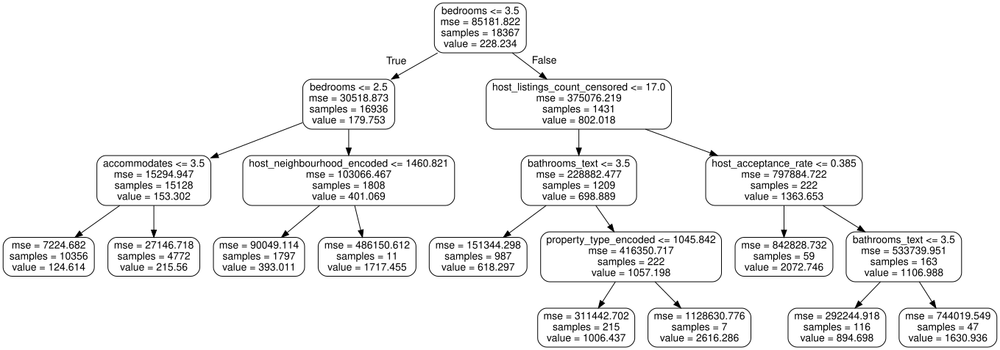

In [61]:
# Visualize the base decision tree
dot_data = export_graphviz(tree_base, feature_names = X_train.columns, rounded=True) 
graph = graphviz.Source(dot_data)
graph

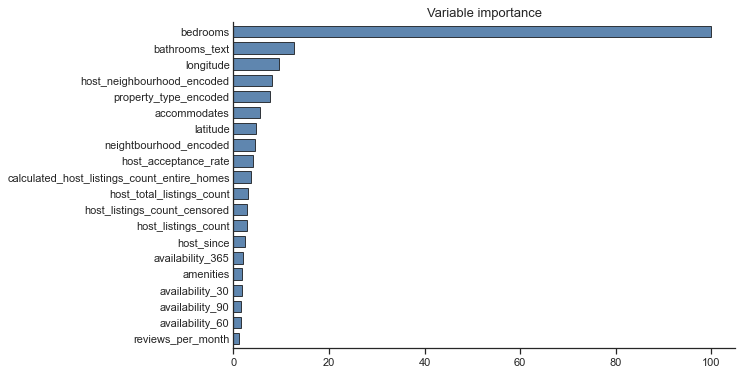

In [62]:
# Plot the features for the random forest
def plot_feature_importance(model, labels, max_features = 20):
    feature_importance = model.feature_importances_*100
    feature_importance = 100*(feature_importance/np.max(feature_importance))
    table = pd.Series(feature_importance, index = labels).sort_values(ascending=True, inplace=False)
    fig, ax = fig, ax = plt.subplots(figsize=(9,6))
    if len(table) > max_features:
        table.iloc[-max_features:].T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)
    else:
        table.T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)
    ax.tick_params(axis=u'y', length=0) 
    ax.set_title('Variable importance', fontsize=13)
    sns.despine()
    return fig, ax

plot_feature_importance(rf_optimized, labels = X_train_tree.columns)
plt.show()

## 3.5 Model 5: Gradient Boosting Models <a class="anchor" id="model5"></a>

[Back to top](#top) 

In [63]:
import xgboost as xgb
import lightgbm as lgb

xgbst = xgb.XGBRegressor(objective='reg:squarederror', booster = 'gbtree', learning_rate = 0.01, 
                        max_depth = 7, n_estimators = 1822, subsample = 0.8,  reg_lambda=0.0, 
                        reg_alpha = 0.0, colsample_bytree = 0.8, min_child_weight = 1.0)

# n_estimators: number of trees
# subsample: fraction of observations used to fit each tree
# reg_lambda: L2 regularisation penalty
# reg_alpha: L1 regularisation penalty
# colsample_bytree: fraction of features considered for each tree (alternatives: bylevel, bynode)
# min_child_weight: approximately equal to the minimum number of samples in each node

lgbm = lgb.LGBMRegressor(objective='regression', boosting_type = 'gbdt', 
                         n_estimators = 1922, learning_rate = 0.01,  
                         num_leaves = 24,
                         lambda_l1 = 0.0, lambda_l2 = 0.0,
                         bagging_fraction = 0.9, bagging_freq = 1, 
                         feature_fraction = 0.8, min_data_in_leaf = 1)

gbm_models = {'XGBoost': xgbst,
              'Light GBM': lgbm
              }

In [64]:
gbm_results = pd.DataFrame(0.0, columns=list(gbm_models.keys()), index=result_rows)

k = 0
for train_index, test_index in folds.split(X_train, y_train):
    print(k, "fold fitting...")
    X_cv_train, X_cv_test = X_train.iloc[train_index,:], X_train.iloc[test_index,:]
    y_cv_train, y_cv_test = y_train.iloc[train_index,:], y_train.iloc[test_index, :]
    
    for i, model in enumerate(list(gbm_models.values())):
        gbm_results.iloc[k, i] = model_scoring(X_cv_train, y_cv_train, X_cv_test, y_cv_test, model)
    
    k += 1
    
for col in list(gbm_models.keys()):
    gbm_results.loc['average', col] = np.mean(gbm_results.loc[:'fold 10', col])
    
results_all = results_all.join(gbm_results)

gbm_results.round(3)

0 fold fitting...
Fit XGBRegressor(base_score=None, booster='gbtree', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=0.8, gamma=None,
             gpu_id=None, importance_type='gain', interaction_constraints=None,
             learning_rate=0.01, max_delta_step=None, max_depth=7,
             min_child_weight=1.0, missing=nan, monotone_constraints=None,
             n_estimators=1822, n_jobs=None, num_parallel_tree=None,
             random_state=None, reg_alpha=0.0, reg_lambda=0.0,
             scale_pos_weight=None, subsample=0.8, tree_method=None,
             validate_parameters=None, verbosity=None) model
Fit LGBMRegressor(bagging_fraction=0.9, bagging_freq=1, feature_fraction=0.8,
              lambda_l1=0.0, lambda_l2=0.0, learning_rate=0.01,
              min_data_in_leaf=1, n_estimators=1922, num_leaves=24,
              objective='regression') model
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: baggi

Fit LGBMRegressor(bagging_fraction=0.9, bagging_freq=1, feature_fraction=0.8,
              lambda_l1=0.0, lambda_l2=0.0, learning_rate=0.01,
              min_data_in_leaf=1, n_estimators=1922, num_leaves=24,
              objective='regression') model
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
6 fold fitting...
Fit XGBRegressor(base_score=0.5, booster='gbtree', c

,XGBoost,Light GBM
fold 1,0.400,0.413
fold 2,0.412,0.419
fold 3,0.412,0.419
fold 4,0.408,0.415
fold 5,0.406,0.414
fold 6,0.403,0.406
fold 7,0.403,0.407
fold 8,0.387,0.398
fold 9,0.414,0.417
fold 10,0.409,0.410


In [65]:
# Holdout performance, perform all hyperparameter tuning before this

for key, model in gbm_models.items():
    results_all.loc['Holdout', key] = model_scoring(X_train, y_train, X_holdout, y_holdout, model)

Fit XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.01, max_delta_step=0, max_depth=7,
             min_child_weight=1.0, missing=nan, monotone_constraints='()',
             n_estimators=1822, n_jobs=4, num_parallel_tree=1, random_state=0,
             reg_alpha=0.0, reg_lambda=0.0, scale_pos_weight=1, subsample=0.8,
             tree_method='exact', validate_parameters=1, verbosity=None) model
Fit LGBMRegressor(bagging_fraction=0.9, bagging_freq=1, feature_fraction=0.8,
              lambda_l1=0.0, lambda_l2=0.0, learning_rate=0.01,
              min_data_in_leaf=1, n_estimators=1922, num_leaves=24,
              objective='regression') model
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alp

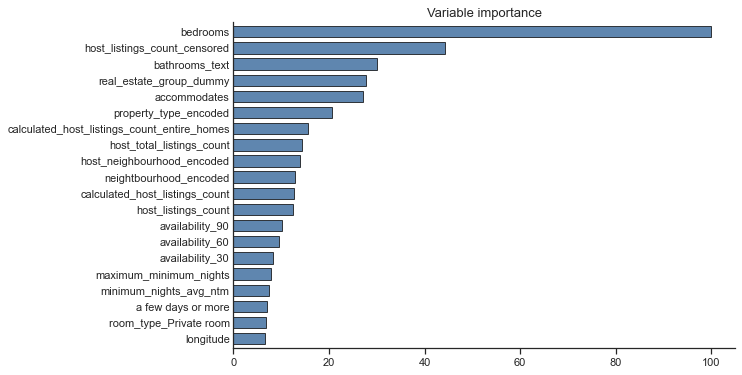

In [66]:
plot_feature_importance(xgbst, labels=X_train.columns)
plt.show()

## 4. Results <a class="anchor" id="results"></a>

[Back to top](#top) 

In [67]:
results_all

,Baseline,Lasso,Ridge,ElasticNet,Drop_Corr,Filtered,Back_Selection,GAM_Baseline,GAM_Baseline 2,GAM_Subset,GAM_Subset_Interaction,GAM_Interaction,GAM_Baseline Optimized,GAM_Interaction Optimized,Decision Tree,Random Forest Base,Random Forest Optimised,XGBoost,Light GBM
fold 1,1.070324,0.602452,1.070401,0.597927,1.114224,0.966464,1.125167,0.540097,0.550102,0.522343,0.500265,0.497725,0.558902,0.495201,0.000000,0.000000,0.000000,0.399551,0.413287
fold 2,1.169981,0.584114,1.170044,0.583979,1.222241,0.882289,1.204658,0.537263,0.552748,0.516698,0.501701,0.489877,0.562980,0.497528,0.000000,0.000000,0.000000,0.412039,0.419056
fold 3,1.085338,0.589048,1.086170,0.589334,1.172926,0.879687,1.169132,0.544873,0.574632,0.515763,0.493119,0.488155,0.576978,0.508734,0.000000,0.000000,0.000000,0.412403,0.419043
fold 4,1.137085,0.598573,1.138038,0.596469,1.228438,0.955360,1.217006,0.577820,0.587288,0.522060,0.499721,0.494456,0.556737,0.497474,0.000000,0.000000,0.000000,0.407538,0.415092
fold 5,1.142342,0.581351,1.144855,0.582644,1.198195,0.907164,1.200149,0.571322,0.620613,0.511985,0.484553,0.490453,0.563230,0.530186,0.000000,0.000000,0.000000,0.406363,0.413545
fold 6,1.196686,0.586683,1.196027,0.584256,1.183583,0.872108,1.183428,0.532612,0.553683,0.518233,0.494782,0.492325,0.550359,0.493220,0.000000,0.000000,0.000000,0.403012,0.406437
fold 7,1.119407,0.578451,1.258700,0.579694,1.120469,0.879700,1.122265,0.555311,0.562757,0.494126,0.481187,0.478915,0.558738,0.482376,0.000000,0.000000,0.000000,0.403341,0.407467
fold 8,1.177796,0.582083,1.177898,0.578993,1.168746,0.840798,1.163689,0.530343,0.579576,0.505006,0.479411,0.474339,0.583405,0.478315,0.000000,0.000000,0.000000,0.387475,0.398307
fold 9,1.139265,0.582500,1.139876,0.581280,1.210803,0.907617,1.195990,0.536910,0.549829,0.506606,0.488997,0.485961,0.575019,0.492308,0.000000,0.000000,0.000000,0.413847,0.417007
fold 10,1.103159,0.604386,1.110018,0.601232,1.158152,0.905486,1.148144,0.547268,0.553837,0.512485,0.507705,0.501443,0.583177,0.520537,0.000000,0.000000,0.000000,0.409434,0.409742


The table above provides an overall summary of each models performance. The overall best model is treebased model, particularly XGBoost.

In [69]:
# select the best model from the Holdout result
sorted_holdout_values = results_all.loc['Holdout'].sort_values()
sorted_holdout_values

XGBoost                      0.396388
Light GBM                    0.403018
Random Forest Optimised      0.415202
Random Forest Base           0.421765
GAM_Interaction              0.475771
GAM_Interaction Optimized    0.476759
GAM_Subset_Interaction       0.481138
GAM_Subset                   0.497772
Decision Tree                0.538938
GAM_Baseline                 0.560304
ElasticNet                   0.569388
Lasso                        0.571888
GAM_Baseline 2               0.581823
GAM_Baseline Optimized       0.586119
Filtered                     0.888919
Ridge                        1.141055
Baseline                     1.145059
Drop_Corr                    1.216671
Back_Selection               1.217044
Name: Holdout, dtype: float64